# CS406 — Phân loại bệnh lá sầu riêng bằng Xử lý ảnh & Deep Learning

Notebook này xây dựng pipeline **10-class Image Classification** cho bệnh/hại trên lá sầu riêng,
kết hợp **xử lý ảnh truyền thống** và **Transfer Learning CNN**.

### Thành phần chính
- Kiểm tra cấu trúc dataset, ảnh lỗi, mất cân bằng lớp.
- Kiểm tra **exact duplicate** bằng MD5 và **near-duplicate** bằng pHash.

- **Color Histogram** để phân tích đặc trưng màu sắc.
- **GLCM** để phân tích texture: contrast, correlation, energy, homogeneity.
- **SVM**: Histogram + GLCM phục vụ phần xử lý ảnh và phân tích đặc trưng.
- Classification chính bằng 3 mô hình Transfer Learning.
- Augmentation chỉ áp dụng cho **train**.
- Ablation: augmentation và fine-tuning.
- Error analysis + Grad-CAM.





## 0. Kiểm tra GPU (T4) & môi trường

In [ ]:
!nvidia-smi


Thu Sep 17 09:47:41 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   40C    P8              9W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
import tensorflow as tf
print("TensorFlow:", tf.__version__)
gpus = tf.config.list_physical_devices('GPU')
print("GPU khả dụng:", gpus)
assert len(gpus) > 0, "Không thấy GPU — vào Runtime > Change runtime type > chọn T4 GPU rồi chạy lại."


TensorFlow: 2.20.0
GPU khả dụng: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## 1. Mount Google Drive

Nhóm dùng Google Drive dùng chung để lưu code / dữ liệu / kết quả giữa các thành viên. Kết quả huấn luyện (`outputs/`, `saved_models/`) sẽ được symlink vào Drive để không bị mất khi Colab ngắt kết nối.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os

# Thư mục gốc của đồ án trên Drive — sửa lại nếu nhóm dùng đường dẫn khác
PROJECT_DIR = "/content/drive/MyDrive/durian_leaf"
os.makedirs(PROJECT_DIR, exist_ok=True)
os.makedirs(f"{PROJECT_DIR}/outputs", exist_ok=True)
os.makedirs(f"{PROJECT_DIR}/saved_models", exist_ok=True)
os.makedirs(f"{PROJECT_DIR}/data", exist_ok=True)
print("PROJECT_DIR:", PROJECT_DIR)


Mounted at /content/drive
PROJECT_DIR: /content/drive/MyDrive/durian_leaf


## 2. Chuẩn bị mã nguồn



In [ ]:
import os, shutil, zipfile

CODE_DIR = "/content/durian_leaf"
drive_zip = f"{PROJECT_DIR}/durian_leaf.zip"

if not os.path.isdir(CODE_DIR):
    if not os.path.exists(drive_zip):
        print("Không tìm thấy code trên Drive — hãy chọn file durian_leaf.zip để upload:")
        from google.colab import files
        uploaded = files.upload()
        local_zip = list(uploaded.keys())[0]
        shutil.copy(local_zip, drive_zip)

    with zipfile.ZipFile(drive_zip, "r") as z:
        z.extractall("/content")
    print("Đã giải nén code vào:", CODE_DIR)
else:
    print("Đã có sẵn code tại:", CODE_DIR)

os.chdir(CODE_DIR)
print("Thư mục làm việc hiện tại:", os.getcwd())
print("Nội dung thư mục:", os.listdir("."))


Đã giải nén code vào: /content/durian_leaf
Thư mục làm việc hiện tại: /content/durian_leaf
Nội dung thư mục: ['baseline.py', 'train.py', 'evaluate.py', 'models.py', 'requirements.txt', 'gradcam.py', 'app.py', 'data_preparation.py', 'config.py', 'README.md', 'dedup.py']


## 3. Cài đặt thư viện

Notebook dùng:
- `imagehash` cho perceptual hashing.
- `scikit-image` cho GLCM.
- `opencv-contrib-python-headless` cho biến đổi ảnh, Canny, SIFT và kiểm tra SURF.
- `scikit-learn` cho SVM và metric.
- Demo bằng **Streamlit**

In [ ]:
!pip -q install imagehash scikit-image opencv-contrib-python-headless


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.5/69.5 MB 15.1 MB/s eta 0:00:00


## 3b.

In [ ]:
!pip install -q imagehash

import os, hashlib
from PIL import Image
import imagehash

# Bỏ qua file/thư mục "rác" hay bị Colab/Jupyter/OS tự sinh ra (vd .ipynb_checkpoints) —
# cần loại trừ ở MỌI chỗ duyệt thư mục lớp, nếu không các bước sau sẽ cố xử lý chúng
# như ảnh thật và báo lỗi/crash.
IGNORE_ENTRIES = {".ipynb_checkpoints", ".DS_Store", "Thumbs.db", "desktop.ini"}
VALID_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
VALID_EXT = tuple(VALID_EXTENSIONS)  # dạng tuple, tiện cho str.endswith(...)

# Tên lớp NỘI BỘ = đúng tên thư mục dùng bởi TensorFlow — nguồn chân lý DUY NHẤT
# cho danh sách 10 lớp. Tên đẹp để hiển thị báo cáo nằm trong DISPLAY_NAMES.
CANONICAL_CLASS_NAMES = [
    "anthracnose_disease", "canker_disease", "fruit_rot", "mealybug_infestation",
    "pink_disease", "sooty_mold", "stem_blight", "stem_cracking_gummosis",
    "thrips_disease", "yellow_leaf",
]

DISPLAY_NAMES = {
    "anthracnose_disease": "Anthracnose",
    "canker_disease": "Canker",
    "fruit_rot": "Fruit rot",
    "mealybug_infestation": "Mealybug",
    "pink_disease": "Pink disease",
    "sooty_mold": "Sooty mold",
    "stem_blight": "Stem blight",
    "stem_cracking_gummosis": "Stem cracking/gummosis",
    "thrips_disease": "Thrips",
    "yellow_leaf": "Yellow leaf",
}


def is_real_file(dir_path, name):
    """True nếu `name` trong `dir_path` là 1 file thật, không phải rác hệ thống/thư mục ẩn."""
    if name.startswith(".") or name in IGNORE_ENTRIES:
        return False
    return os.path.isfile(os.path.join(dir_path, name))


def class_dirs_in(root):
    """Danh sách thư mục con của root (bỏ qua file lẻ, thư mục rác)."""
    return sorted([
        d for d in os.listdir(root)
        if os.path.isdir(os.path.join(root, d)) and d not in IGNORE_ENTRIES and not d.startswith(".")
    ])


def list_class_dirs(split_dir):
    """Giống class_dirs_in nhưng không kiểm tra isdir — dùng ở chỗ chỉ cần lọc tên."""
    return [c for c in os.listdir(split_dir) if not c.startswith(".") and c not in IGNORE_ENTRIES]


def list_valid_files(cls_dir):
    """Danh sách file ảnh hợp lệ (bỏ qua rác hệ thống) trong 1 thư mục lớp."""
    return [
        f for f in os.listdir(cls_dir)
        if not f.startswith(".") and f not in IGNORE_ENTRIES
        and os.path.isfile(os.path.join(cls_dir, f))
    ]


def has_split_structure(root):
    """True nếu root chứa 3 thư mục train/validation(hoặc val)/test."""
    if not os.path.isdir(root):
        return False
    names = {d.lower() for d in os.listdir(root) if os.path.isdir(os.path.join(root, d))}
    return "train" in names and ("validation" in names or "val" in names) and "test" in names


def md5_of(fpath):
    """Hash MD5 (trùng lặp CHÍNH XÁC) của 1 file ảnh."""
    h = hashlib.md5()
    with open(fpath, "rb") as f:
        for chunk in iter(lambda: f.read(65536), b""):
            h.update(chunk)
    return h.hexdigest()


def phash_of(fpath):
    """Perceptual hash (trùng lặp GẦN ĐÚNG, vd raw vs crop) — trả về đối tượng
    imagehash.ImageHash (hỗ trợ phép trừ `a - b` để tính Hamming distance),
    hoặc None nếu ảnh lỗi/không đọc được."""
    try:
        with Image.open(fpath) as im:
            return imagehash.phash(im.convert("RGB"))
    except Exception:
        return None


print("Đã định nghĩa các hàm/hằng số tiện ích dùng chung cho các mục phía dưới.")


Đã định nghĩa các hàm/hằng số tiện ích dùng chung cho các mục phía dưới.


## 4A.




In [ ]:
# ============================================================
# DISTRIBUTED DATASET GUARDRAIL — 5,451 USABLE IMAGES
# Published description reports 5,452; archive used here has 5,451.
# ============================================================
import os
from pathlib import Path
from PIL import Image

EXPECTED_DISTRIBUTED_TOTAL = 5451
EXPECTED_OFFICIAL_TOTAL = EXPECTED_DISTRIBUTED_TOTAL  # compatibility with legacy cells
PUBLISHED_TOTAL = 5452
EXPECTED_SPLITS = {"train": 4154, "validation": 649, "test": 648}

VALID_IMAGE_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

FORCE_REBUILD_FROM_RAW = True
KEEP_ALL_VALID_IMAGES = True
REMOVE_EXACT_DUPLICATES = False
REMOVE_NEAR_DUPLICATES = False

def list_images(root):
    root = Path(root)
    return sorted(
        p for p in root.rglob("*")
        if p.is_file()
        and p.suffix.lower() in VALID_IMAGE_EXTS
        and "__MACOSX" not in p.parts
    )

def verify_readable(paths):
    bad = []
    for p in paths:
        try:
            with Image.open(p) as im:
                im.verify()
        except Exception as e:
            bad.append((str(p), repr(e)))
    return bad

def count_split(root):
    return len(list_images(root))

print("DISTRIBUTED DATASET MODE")
print("EXPECTED_DISTRIBUTED_TOTAL =", EXPECTED_DISTRIBUTED_TOTAL)
print("PUBLISHED_TOTAL            =", PUBLISHED_TOTAL)
print("EXPECTED_SPLITS             =", EXPECTED_SPLITS)
print("REMOVE_EXACT_DUPLICATES     =", REMOVE_EXACT_DUPLICATES)
print("REMOVE_NEAR_DUPLICATES      =", REMOVE_NEAR_DUPLICATES)
print("→ __MACOSX ignored; duplicate audit chỉ báo cáo, KHÔNG xóa ảnh.")


DISTRIBUTED DATASET MODE
EXPECTED_DISTRIBUTED_TOTAL = 5451
PUBLISHED_TOTAL            = 5452
EXPECTED_SPLITS             = {'train': 4154, 'validation': 649, 'test': 648}
REMOVE_EXACT_DUPLICATES     = False
REMOVE_NEAR_DUPLICATES      = False
→ __MACOSX ignored; duplicate audit chỉ báo cáo, KHÔNG xóa ảnh.


## 4. Chuẩn bị dữ liệu



### Dataset thực tế dùng cho thí nghiệm
Archive trên Drive có **5.451 ảnh sử dụng được**: 4.154 train, 649 validation,
648 test. `__MACOSX` là metadata của macOS nên bị bỏ qua.


In [ ]:
# VERIFIED DISTRIBUTED DATASET v5
import os, shutil, zipfile
from pathlib import Path, PurePosixPath

EXPECTED_USABLE_TOTAL=5451
EXPECTED_SPLITS={"train":4154,"validation":649,"test":648}
EXT={".jpg",".jpeg",".png",".bmp",".webp"}
DATA_DIR=os.path.join(CODE_DIR,"data")
RAW_ZIP=f"{PROJECT_DIR}/Durian_Diseases.zip"
TMP="/content/durian_5451"

def imgs(root):
    p=Path(root)
    return [] if not p.exists() else [x for x in p.rglob("*")
        if x.is_file() and x.suffix.lower() in EXT and "__MACOSX" not in x.parts]

def cnt(root): return len(imgs(root))
def counts(root):
    p=Path(root)
    return {s:cnt(p/s) for s in ("train","validation","test")}

def find_splits(root):
    root=Path(root)
    for p in [root]+[x for x in root.rglob("*") if x.is_dir() and "__MACOSX" not in x.parts]:
        try:
            d={x.name.lower():x for x in p.iterdir() if x.is_dir() and "__MACOSX" not in x.parts}
            if all(s in d for s in ("train","validation","test")):
                return d,p
        except: pass
    return None,None

print("Nguồn:",RAW_ZIP)
print("Expected:",EXPECTED_SPLITS,"TOTAL",EXPECTED_USABLE_TOTAL)
local=counts(DATA_DIR) if os.path.isdir(DATA_DIR) else {"train":0,"validation":0,"test":0}
print("Local:",local,"TOTAL",sum(local.values()))

if local!=EXPECTED_SPLITS:
    if not os.path.isfile(RAW_ZIP): raise RuntimeError("Không tìm thấy "+RAW_ZIP)
    if os.path.exists(TMP): shutil.rmtree(TMP)
    os.makedirs(TMP)
    with zipfile.ZipFile(RAW_ZIP) as z:
        bad=z.testzip()
        if bad: raise RuntimeError("ZIP corrupt: "+bad)
        real=[n for n in z.namelist()
              if "__MACOSX" not in PurePosixPath(n).parts
              and PurePosixPath(n).suffix.lower() in EXT]
        print("Usable images excluding __MACOSX:",len(real))
        if len(real)!=EXPECTED_USABLE_TOTAL:
            raise RuntimeError(f"usable={len(real)}, expected={EXPECTED_USABLE_TOTAL}")
        for info in z.infolist():
            if "__MACOSX" not in PurePosixPath(info.filename).parts:
                z.extract(info,TMP)

    d,root=find_splits(TMP)
    if d is None: raise RuntimeError("Không tìm thấy Train/Validation/Test")
    sc={s:cnt(d[s]) for s in ("train","validation","test")}
    print("Source root:",root); print("Source counts:",sc)
    if sc!=EXPECTED_SPLITS: raise RuntimeError(f"Split mismatch: {sc}")

    build=os.path.join(CODE_DIR,"data_5451_tmp")
    if os.path.exists(build): shutil.rmtree(build)
    for s in ("train","validation","test"):
        shutil.copytree(d[s],Path(build)/s)
    if counts(build)!=EXPECTED_SPLITS: raise RuntimeError("Temporary build mismatch")
    if os.path.exists(DATA_DIR): shutil.rmtree(DATA_DIR)
    os.replace(build,DATA_DIR)

final=counts(DATA_DIR)
print("\n=== DATASET RECONCILIATION ===")
for k,v in final.items(): print(f"{k:10s}: {v:,}")
print(f"{'TOTAL':10s}: {sum(final.values()):,}")
if final!=EXPECTED_SPLITS: raise RuntimeError(f"Final mismatch: {final}")
print("✓ VERIFIED: 5,451 usable images; __MACOSX ignored.")
print("Published description reports 5,452; distributed archive used here differs by 1 validation image.")


Nguồn: /content/drive/MyDrive/durian_leaf/Durian_Diseases.zip
Expected: {'train': 4154, 'validation': 649, 'test': 648} TOTAL 5451
Local: {'train': 0, 'validation': 0, 'test': 0} TOTAL 0
Usable images excluding __MACOSX: 5451
Source root: /content/durian_5451/Ten_Classes_of_Durian_Leaf_Diseases
Source counts: {'train': 4154, 'validation': 649, 'test': 648}

=== DATASET RECONCILIATION ===
train     : 4,154
validation: 649
test      : 648
TOTAL     : 5,451
✓ VERIFIED: 5,451 usable images; __MACOSX ignored.
Published description reports 5,452; distributed archive used here differs by 1 validation image.


## 4b. Đối chiếu số ảnh mỗi lớp với số liệu công bố chính thức

Bài báo *Data in Brief* (Nguyen, T., 2025, vol. 63) đi kèm dataset này công bố tổng 5452 ảnh, phân bố theo 10 lớp bệnh (xem bảng bên dưới). So khớp số ảnh THÔ (trước dedup) mỗi lớp vừa tải về với số liệu này — nếu lệch nhiều (>15-20%), khả năng cao là tải thiếu/lỗi giải nén, KHÔNG PHẢI do dedup gây ra (dedup chỉ nên làm giảm nhẹ, không phải giảm mạnh).



In [ ]:
from pathlib import Path
from collections import defaultdict
import pandas as pd

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

EXPECTED_SPLIT = {
    "train": 4154,
    "validation": 649,
    "test": 648,
}

print("=== DATASET PROVENANCE / RECONCILIATION ===\n")

rows = []

for split, expected in EXPECTED_SPLIT.items():
    split_dir = Path(DATA_DIR) / split

    actual = sum(
        1 for p in split_dir.rglob("*")
        if p.is_file() and p.suffix.lower() in IMG_EXTS
    )

    rows.append({
        "Tập dữ liệu": split.capitalize(),
        "Số ảnh thực tế": actual,
        "Số ảnh kỳ vọng": expected,
        "Chênh lệch": actual - expected,
    })

df_split = pd.DataFrame(rows)

display(df_split)

total_actual = df_split["Số ảnh thực tế"].sum()
total_expected = sum(EXPECTED_SPLIT.values())

print(f"\nTổng ảnh sử dụng: {total_actual:,}")
print(f"Tổng kỳ vọng từ distributed archive: {total_expected:,}")

assert total_actual == 5451, (
    f"Dataset không hợp lệ: {total_actual} ảnh, expected 5451"
)

assert all(df_split["Chênh lệch"] == 0), (
    "Split count không đúng."
)

print("\n✓ Dataset hợp lệ: 5,451 ảnh")
print("✓ Train      : 4,154")
print("✓ Validation : 649")
print("✓ Test       : 648")
print("✓ __MACOSX không được tính")
print("✓ Không xóa ảnh do duplicate")
print("✓ Duplicate/near-duplicate chỉ được AUDIT")
print()
print(
    "Lưu ý: mô tả công bố báo cáo 5,452 ảnh; "
    "archive phân phối được sử dụng trong thí nghiệm này "
    "chứa 5,451 ảnh, thiếu 1 ảnh ở validation."
)

=== DATASET PROVENANCE / RECONCILIATION ===



,Tập dữ liệu,Số ảnh thực tế,Số ảnh kỳ vọng,Chênh lệch
0,Train,4154,4154,0
1,Validation,649,649,0
2,Test,648,648,0



Tổng ảnh sử dụng: 5,451
Tổng kỳ vọng từ distributed archive: 5,451

✓ Dataset hợp lệ: 5,451 ảnh
✓ Train      : 4,154
✓ Validation : 649
✓ Test       : 648
✓ __MACOSX không được tính
✓ Không xóa ảnh do duplicate
✓ Duplicate/near-duplicate chỉ được AUDIT

Lưu ý: mô tả công bố báo cáo 5,452 ảnh; archive phân phối được sử dụng trong thí nghiệm này chứa 5,451 ảnh, thiếu 1 ảnh ở validation.


In [ ]:
# Kiểm tra số lượng ảnh mỗi lớp / mỗi tập
import config
import importlib
import os
importlib.reload(config)
# (IGNORE_ENTRIES, VALID_EXTENSIONS đã định nghĩa ở Mục 3b — dùng lại.)

# [FIX] Trước đây lặp theo config.CLASS_NAMES: tại Mục 5 này tên thư mục lớp CHƯA
# được chuẩn hóa (chỉ xảy ra ở Mục 7, chạy SAU) nên có thể chưa khớp config.CLASS_NAMES
# -> mọi số đếm ra 0 dù dữ liệu vẫn tồn tại (đúng như log đã chạy trước khi sửa).
# Dùng tên thư mục THỰC TẾ trên đĩa (class_dirs_in, Mục 3b) để đếm đúng bất kể tên
# lớp đã được chuẩn hóa hay chưa.
for split, split_dir in [("train", config.TRAIN_DIR), ("validation", config.VAL_DIR), ("test", config.TEST_DIR)]:
    print(f"--- {split} ---")
    total = 0
    for cls in class_dirs_in(split_dir):
        cls_dir = os.path.join(split_dir, cls)
        n = sum(1 for f in os.listdir(cls_dir)
                if f not in IGNORE_ENTRIES and not f.startswith(".")
                and os.path.isfile(os.path.join(cls_dir, f))
                and os.path.splitext(f)[1].lower() in VALID_EXTENSIONS)
        total += n
        print(f"  {cls:28s}: {n}")
    print(f"  {"TOTAL":28s}: {total}\n")


--- train ---
  anthracnose_disease         : 424
  canker_disease              : 427
  fruit_rot                   : 406
  mealybug_infestation        : 406
  pink_disease                : 416
  sooty_mold                  : 407
  stem_blight                 : 426
  stem_cracking_ gummosis     : 424
  thrips_disease              : 405
  yellow_leaf                 : 413
  TOTAL                       : 4154

--- validation ---
  anthracnose_disease         : 62
  canker_disease              : 65
  fruit_rot                   : 61
  mealybug_infestation        : 65
  pink_disease                : 65
  sooty_mold                  : 68
  stem_blight                 : 64
  stem_cracking_ gummosis     : 68
  thrips_disease              : 66
  yellow_leaf                 : 65
  TOTAL                       : 649

--- test ---
  anthracnose_disease         : 63
  canker_disease              : 65
  fruit_rot                   : 61
  mealybug_infestation        : 65
  pink_disease               

## 5. 🔴 Xác minh dataset gốc




In [ ]:
import os
import config, importlib
importlib.reload(config)
from PIL import Image

# CANONICAL_CLASS_NAMES, DISPLAY_NAMES, IGNORE_ENTRIES, VALID_EXTENSIONS đã định
# nghĩa ở Mục 3b (Hàm tiện ích dùng chung) — dùng lại, không định nghĩa lại ở đây.

def scan_split(split_dir):
    """Quét 1 tập: chỉ kiểm tra file ảnh thật, bỏ qua file hệ thống."""
    report = {"n_images": 0, "n_corrupt": 0, "n_tiny": 0, "corrupt_files": [], "formats": {}, "sizes": []}
    if not os.path.isdir(split_dir):
        print(f"  [!] Không tìm thấy thư mục: {split_dir}")
        return report
    for cls in sorted(os.listdir(split_dir)):
        if cls.startswith(".") or cls in IGNORE_ENTRIES:
            continue
        cls_dir = os.path.join(split_dir, cls)
        if not os.path.isdir(cls_dir):
            continue
        for fname in os.listdir(cls_dir):
            if fname.startswith(".") or fname in IGNORE_ENTRIES:
                continue
            fpath = os.path.join(cls_dir, fname)
            if not os.path.isfile(fpath):
                continue
            if os.path.splitext(fname)[1].lower() not in VALID_EXTENSIONS:
                continue
            report["n_images"] += 1
            fsize = os.path.getsize(fpath)
            if fsize < 1024:
                report["n_tiny"] += 1
                report["corrupt_files"].append((fpath, "file quá nhỏ (<1KB)"))
                continue
            try:
                with Image.open(fpath) as im:
                    im.verify()
                with Image.open(fpath) as im:
                    report["formats"][im.format] = report["formats"].get(im.format, 0) + 1
                    report["sizes"].append(im.size)
            except Exception as e:
                report["n_corrupt"] += 1
                report["corrupt_files"].append((fpath, str(e)))
    return report

print("Đang xác minh dataset — chỉ quét file ảnh hợp lệ...\n")
all_reports = {}
for split, split_dir in [("train", config.TRAIN_DIR), ("validation", config.VAL_DIR), ("test", config.TEST_DIR)]:
    print(f"--- {split} ---")
    rep = scan_split(split_dir)
    all_reports[split] = rep
    print(f"  Tổng số ảnh   : {rep["n_images"]}")
    print(f"  Ảnh hỏng      : {rep["n_corrupt"]}")
    print(f"  File quá nhỏ  : {rep["n_tiny"]}")
    print(f"  Định dạng     : {rep["formats"]}")
    if rep["sizes"]:
        ws = [s[0] for s in rep["sizes"]]
        hs = [s[1] for s in rep["sizes"]]
        print(f"  Kích thước    : min=({min(ws)}x{min(hs)}) max=({max(ws)}x{max(hs)})")
    print()

actual_classes = {
    d for d in os.listdir(config.TRAIN_DIR)
    if os.path.isdir(os.path.join(config.TRAIN_DIR, d)) and d not in IGNORE_ENTRIES and not d.startswith(".")
} if os.path.isdir(config.TRAIN_DIR) else set()
expected = set(CANONICAL_CLASS_NAMES)
missing = expected - actual_classes
extra = actual_classes - expected
if missing or extra:
    print("[!] Tên lớp thực tế chưa khớp danh sách chuẩn nội bộ.")
    if missing: print("    thiếu:", sorted(missing))
    if extra: print("    thừa:", sorted(extra))
else:
    print("✓ 10 tên lớp nội bộ khớp chính xác với cấu trúc dataset.")

total_bad = sum(r["n_corrupt"] + r["n_tiny"] for r in all_reports.values())
if total_bad:
    print(f"\n[!] Có {total_bad} file ảnh lỗi/quá nhỏ — xem all_reports để xử lý trước khi train.")
else:
    print("\n✓ Không phát hiện ảnh lỗi hoặc file quá nhỏ trong các định dạng ảnh được kiểm tra.")


Đang xác minh dataset — chỉ quét file ảnh hợp lệ...

--- train ---
  Tổng số ảnh   : 4154
  Ảnh hỏng      : 0
  File quá nhỏ  : 0
  Định dạng     : {'PNG': 3914, 'JPEG': 240}
  Kích thước    : min=(150x150) max=(1736x1452)

--- validation ---
  Tổng số ảnh   : 649
  Ảnh hỏng      : 0
  File quá nhỏ  : 0
  Định dạng     : {'PNG': 623, 'JPEG': 26}
  Kích thước    : min=(150x150) max=(1824x1254)

--- test ---
  Tổng số ảnh   : 648
  Ảnh hỏng      : 0
  File quá nhỏ  : 0
  Định dạng     : {'PNG': 621, 'JPEG': 27}
  Kích thước    : min=(150x150) max=(1630x1384)

[!] Tên lớp thực tế chưa khớp danh sách chuẩn nội bộ.
    thiếu: ['stem_cracking_gummosis']
    thừa: ['stem_cracking_ gummosis']

✓ Không phát hiện ảnh lỗi hoặc file quá nhỏ trong các định dạng ảnh được kiểm tra.


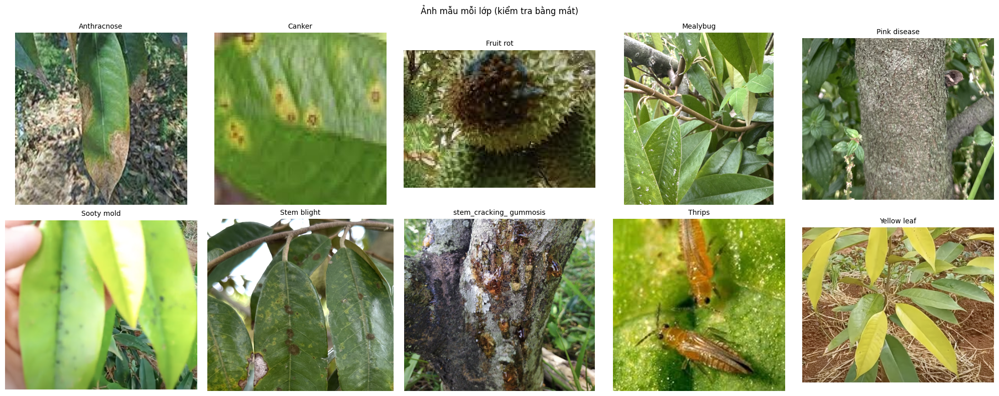

Đã lưu: outputs/sample_images_per_class.png


In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# [FIX] Trước đây lọc theo config.CLASS_NAMES (isdir check) -> tại Mục 5b này, tên
# thư mục lớp CHƯA được chuẩn hóa (việc đó chỉ xảy ra ở Mục 7, chạy SAU) nên có thể
# chưa khớp config.CLASS_NAMES -> classes_sorted rỗng -> plt.subplots(0, ncols) crash
# với "Number of rows must be a positive integer, not 0" (đúng lỗi đã gặp khi chạy).
# Dùng tên thư mục THỰC TẾ trên đĩa (class_dirs_in, định nghĩa ở Mục 3b) để không phụ
# thuộc vào việc config.py đã được đồng bộ hay chưa.
classes_sorted = class_dirs_in(config.TRAIN_DIR) if os.path.isdir(config.TRAIN_DIR) else []
n = len(classes_sorted)

if n == 0:
    print(f"[!] Không tìm thấy thư mục lớp nào trong {config.TRAIN_DIR} — bỏ qua vẽ ảnh mẫu.")
    print("    Kiểm tra lại Mục 4 (chuẩn bị dữ liệu) đã tạo dữ liệu vào đúng thư mục chưa.")
else:
    ncols = min(5, n)
    nrows = (n + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 4 * nrows), squeeze=False)
    axes = axes.flatten()

    # VALID_EXTENSIONS đã định nghĩa ở Mục 3b — dùng lại.
    for ax, cls in zip(axes, classes_sorted):
        cls_dir = os.path.join(config.TRAIN_DIR, cls)
        files = sorted([
            f for f in os.listdir(cls_dir)
            if os.path.isfile(os.path.join(cls_dir, f))
            and os.path.splitext(f)[1].lower() in VALID_EXTENSIONS
        ])
        if files:
            try:
                with Image.open(os.path.join(cls_dir, files[0])) as img:
                    ax.imshow(img.copy())
            except Exception as e:
                ax.text(0.5, 0.5, f"Không đọc được\n{e}", ha="center", va="center")
        ax.set_title(DISPLAY_NAMES.get(cls, cls), fontsize=10)
        ax.axis("off")
    for ax in axes[n:]:
        ax.axis("off")

    plt.suptitle("Ảnh mẫu mỗi lớp (kiểm tra bằng mắt)")
    plt.tight_layout()
    os.makedirs("outputs", exist_ok=True)
    plt.savefig("outputs/sample_images_per_class.png", dpi=120, bbox_inches="tight")
    plt.show()
    print("Đã lưu: outputs/sample_images_per_class.png")


## 5b. Trực quan hoá phân bố dữ liệu (EDA)

Tổng hợp lại thành biểu đồ để trả lời trực tiếp câu hỏi "input đầu vào đạt yêu cầu chưa":
1. **Phân bố số lượng ảnh theo lớp/tập** (biểu đồ cột) + **tỉ lệ mất cân bằng lớp** (max/min trên tập train).
2. **Tỉ lệ chia tập THỰC TẾ** so với 70/15/15 kỳ vọng (Mục 6 có thể làm lệch tỉ lệ này nếu phải xoá leakage — xem cảnh báo ở Mục 6).
3. **Phân bố kích thước ảnh** (width/height) — đối chiếu với `config.IMG_SIZE` dùng khi resize cho model.

Lưu cả 2 biểu đồ vào `outputs/eda_*.png` để đưa vào báo cáo.


,train,validation,test,total
anthracnose_disease,424,62,63,549
canker_disease,427,65,65,557
fruit_rot,406,61,61,528
mealybug_infestation,406,65,65,536
pink_disease,416,65,68,549
sooty_mold,407,68,66,541
stem_blight,426,64,64,554
stem_cracking_ gummosis,424,68,68,560
thrips_disease,405,66,66,537
yellow_leaf,413,65,62,540



Tỉ lệ mất cân bằng lớp (train, max/min): 1.05x (nhiều nhất: canker_disease = 427, ít nhất: thrips_disease = 405)
-> Mức mất cân bằng nhẹ, chấp nhận được.

Tỉ lệ chia tập THỰC TẾ (kỳ vọng ~70/15/15):
  train     :  4154 ảnh (76.2%, kỳ vọng 70%) [!] lệch >5 điểm % so với kỳ vọng
  validation:   649 ảnh (11.9%, kỳ vọng 15%)
  test      :   648 ảnh (11.9%, kỳ vọng 15%)
Nếu lệch nhiều: bình thường nếu Mục 6 vừa xoá leakage ở validation/test (xem cảnh báo Mục 6),
không phải lỗi chia tập ở Mục 4.


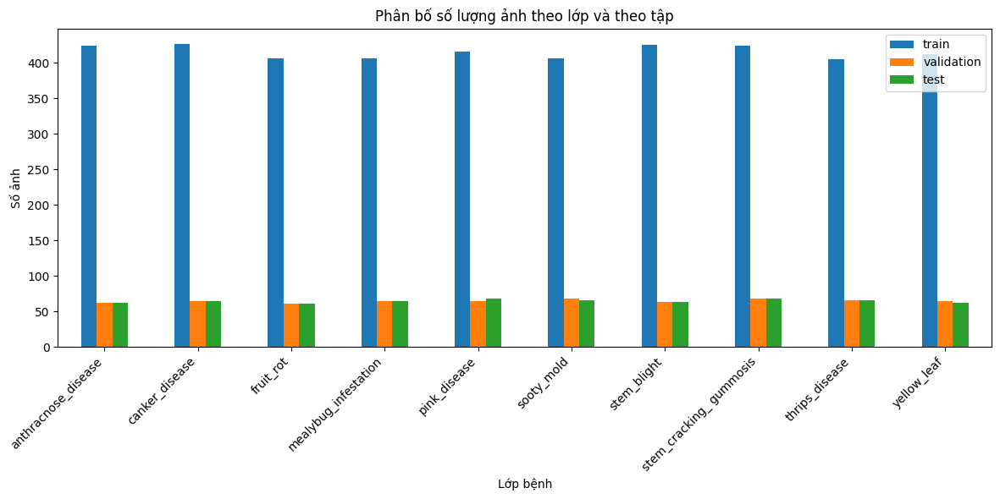

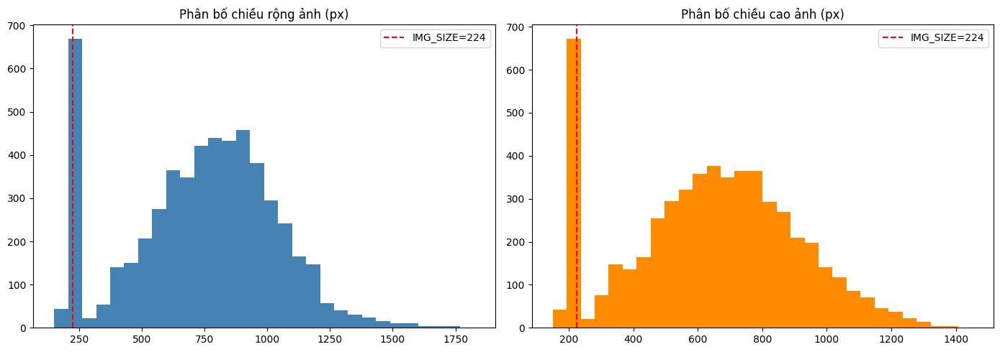


Kích thước resize dùng khi train (config.IMG_SIZE): (224, 224)
-> Ảnh gốc có nhiều kích thước khác nhau (xem biểu đồ trên) nên bắt buộc phải resize về
   IMG_SIZE trước khi đưa vào model — make_dataset()/build_model() đã xử lý việc này.

Đã lưu: outputs/eda_class_distribution.png, outputs/eda_image_size_distribution.png


In [ ]:
import os
import matplotlib.pyplot as plt
import pandas as pd
import config, importlib
importlib.reload(config)
# (IGNORE_ENTRIES, VALID_EXTENSIONS đã định nghĩa ở Mục 3b — dùng lại.)

# [FIX] Trước đây lặp theo config.CLASS_NAMES: tại Mục 5b này tên thư mục lớp CHƯA
# được chuẩn hóa (chỉ xảy ra ở Mục 7, chạy SAU) nên có thể chưa khớp config.CLASS_NAMES
# -> toàn bộ bảng ra số 0, tỉ lệ mất cân bằng = 0/0. Dùng tên thư mục THỰC TẾ trên đĩa
# (hợp nhất từ cả 3 tập, qua class_dirs_in ở Mục 3b) để đếm đúng bất kể đã chuẩn hóa
# tên lớp hay chưa.
all_classes = sorted(set(
    cls
    for split_dir in [config.TRAIN_DIR, config.VAL_DIR, config.TEST_DIR]
    for cls in class_dirs_in(split_dir)
))

# 1) Số lượng ảnh mỗi lớp / mỗi tập -> bảng + biểu đồ cột nhóm
counts = {}
for split, split_dir in [("train", config.TRAIN_DIR), ("validation", config.VAL_DIR), ("test", config.TEST_DIR)]:
    counts[split] = {}
    for cls in all_classes:
        cls_dir = os.path.join(split_dir, cls)
        if os.path.isdir(cls_dir):
            n = sum(1 for f in os.listdir(cls_dir)
                    if f not in IGNORE_ENTRIES and not f.startswith(".")
                    and os.path.isfile(os.path.join(cls_dir, f))
                    and os.path.splitext(f)[1].lower() in VALID_EXTENSIONS)
        else:
            n = 0
        counts[split][cls] = n

df_counts = pd.DataFrame(counts)
df_counts["total"] = df_counts.sum(axis=1)
display(df_counts)

# Tỉ lệ mất cân bằng lớp (trên tập train) — max/min
# [FIX] Bọc thêm kiểm tra min==0 để tránh ZeroDivisionError/NaN khi 1 lớp không có
# ảnh train nào (dù là do lỗi tên lớp hay do dữ liệu thật sự thiếu).
if df_counts["train"].max() == 0:
    print("\n[!] Không đếm được ảnh train nào — kiểm tra lại Mục 4 (chuẩn bị dữ liệu) và TRAIN_DIR.")
elif df_counts["train"].min() == 0:
    zero_classes = df_counts.index[df_counts["train"] == 0].tolist()
    print(f"\n[!] Có lớp không có ảnh train nào: {zero_classes} — kiểm tra lại dữ liệu/tên thư mục.")
else:
    imbalance_ratio = df_counts["train"].max() / df_counts["train"].min()
    print(f"\nTỉ lệ mất cân bằng lớp (train, max/min): {imbalance_ratio:.2f}x "
          f"(nhiều nhất: {df_counts['train'].idxmax()} = {df_counts['train'].max()}, "
          f"ít nhất: {df_counts['train'].idxmin()} = {df_counts['train'].min()})")
    if imbalance_ratio >= 1.5:
        print("-> Mất cân bằng đáng kể (>=1.5x) — dùng --use_class_weights khi train (đã có ở Mục 11) là cần thiết.")
    else:
        print("-> Mức mất cân bằng nhẹ, chấp nhận được.")

# Tỉ lệ chia tập THỰC TẾ so với 70/15/15 kỳ vọng
totals = df_counts[["train", "validation", "test"]].sum()
grand_total = totals.sum()
print("\nTỉ lệ chia tập THỰC TẾ (kỳ vọng ~70/15/15):")
EXPECTED_PCT = {"train": 70, "validation": 15, "test": 15}
for split in ["train", "validation", "test"]:
    pct = 100 * totals[split] / grand_total
    flag = " [!] lệch >5 điểm % so với kỳ vọng" if abs(pct - EXPECTED_PCT[split]) > 5 else ""
    print(f"  {split:10s}: {totals[split]:5d} ảnh ({pct:.1f}%, kỳ vọng {EXPECTED_PCT[split]}%){flag}")
print("Nếu lệch nhiều: bình thường nếu Mục 6 vừa xoá leakage ở validation/test (xem cảnh báo Mục 6),")
print("không phải lỗi chia tập ở Mục 4.")

fig, ax = plt.subplots(figsize=(12, 6))
df_counts[["train", "validation", "test"]].plot(kind="bar", ax=ax)
ax.set_title("Phân bố số lượng ảnh theo lớp và theo tập")
ax.set_ylabel("Số ảnh")
ax.set_xlabel("Lớp bệnh")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
os.makedirs("outputs", exist_ok=True)
plt.savefig("outputs/eda_class_distribution.png", dpi=120)
plt.show()

# 2) Phân bố kích thước ảnh — tái sử dụng all_reports (đã quét ở Mục 5) nếu có, tránh quét lại toàn bộ ảnh lần 2
if "all_reports" in globals() and any(r.get("sizes") for r in all_reports.values()):
    widths = [s[0] for r in all_reports.values() for s in r["sizes"]]
    heights = [s[1] for r in all_reports.values() for s in r["sizes"]]
else:
    from PIL import Image
    widths, heights = [], []
    for split_dir in [config.TRAIN_DIR, config.VAL_DIR, config.TEST_DIR]:
        if not os.path.isdir(split_dir):
            continue
        for cls in os.listdir(split_dir):
            cls_dir = os.path.join(split_dir, cls)
            if not os.path.isdir(cls_dir):
                continue
            for fname in os.listdir(cls_dir):
                if os.path.splitext(fname)[1].lower() not in VALID_EXTENSIONS:
                    continue
                try:
                    with Image.open(os.path.join(cls_dir, fname)) as im:
                        widths.append(im.size[0]); heights.append(im.size[1])
                except Exception:
                    pass

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].hist(widths, bins=30, color="steelblue")
axes[0].set_title("Phân bố chiều rộng ảnh (px)")
axes[0].axvline(config.IMG_SIZE[0], color="red", linestyle="--", label=f"IMG_SIZE={config.IMG_SIZE[0]}")
axes[0].legend()
axes[1].hist(heights, bins=30, color="darkorange")
axes[1].set_title("Phân bố chiều cao ảnh (px)")
axes[1].axvline(config.IMG_SIZE[1], color="red", linestyle="--", label=f"IMG_SIZE={config.IMG_SIZE[1]}")
axes[1].legend()
plt.tight_layout()
plt.savefig("outputs/eda_image_size_distribution.png", dpi=120)
plt.show()

print(f"\nKích thước resize dùng khi train (config.IMG_SIZE): {config.IMG_SIZE}")
print("-> Ảnh gốc có nhiều kích thước khác nhau (xem biểu đồ trên) nên bắt buộc phải resize về")
print("   IMG_SIZE trước khi đưa vào model — make_dataset()/build_model() đã xử lý việc này.")
print("\nĐã lưu: outputs/eda_class_distribution.png, outputs/eda_image_size_distribution.png")


### 6. 🟠 Chuẩn hóa dataset 10 class


1. Đổi tên thư mục lớp về đúng **10 tên chuẩn** (danh sách cố định — nguồn chân lý duy nhất).
2. Báo lỗi rõ ràng nếu có thư mục lạ không nhận diện được, để kiểm tra thủ công thay vì âm thầm bỏ qua.
3. **Tự động ghi `CLASS_NAMES` vào `config.py`** — không cần copy tay như trước, tránh lệch giữa dữ liệu thực tế và cấu hình.


In [ ]:
import os, re, shutil
import config, importlib
importlib.reload(config)

# CANONICAL_CLASS_NAMES đã định nghĩa ở Mục 3b (Hàm tiện ích dùng chung) — dùng lại.
# Tên đẹp để hiển thị báo cáo nằm trong DISPLAY_NAMES (cũng ở Mục 3b).

CLASS_ALIASES = {

    "anthracnose": "anthracnose_disease",
    "anthracnose disease": "anthracnose_disease",
    "canker": "canker_disease",
    "canker disease": "canker_disease",
    "fruit rot": "fruit_rot",
    "mealybug": "mealybug_infestation",
    "mealybug infestation": "mealybug_infestation",
    "pink disease": "pink_disease",
    "sooty mold": "sooty_mold",
    "stem blight": "stem_blight",
    "stem cracking/gummosis": "stem_cracking_gummosis",
    "stem cracking gummosis": "stem_cracking_gummosis",
    "stem_cracking_gummosis": "stem_cracking_gummosis",
    "gummosis": "stem_cracking_gummosis",
    "thrips": "thrips_disease",
    "thrips disease": "thrips_disease",
    "yellow leaf": "yellow_leaf",
}

def normalize_name(name):

    key = name.strip().lower()
    key = re.sub(r"[_\-/]+", " ", key)
    key = re.sub(r"\s+", " ", key).strip()
    return key


# Chuẩn hóa cả 2 phía (alias keys VÀ tên lớp chuẩn) theo CÙNG quy tắc ở trên, để
# việc so khớp không phụ thuộc dataset dùng dấu cách hay dấu gạch dưới/ngang.
_NORMALIZED_ALIASES = {normalize_name(k): v for k, v in CLASS_ALIASES.items()}
_NORMALIZED_CANONICAL = {normalize_name(x): x for x in CANONICAL_CLASS_NAMES}


def canonicalize(name):
    key = normalize_name(name)
    if key in _NORMALIZED_ALIASES:
        return _NORMALIZED_ALIASES[key]
    if key in _NORMALIZED_CANONICAL:
        return _NORMALIZED_CANONICAL[key]
    return None

# IGNORE_ENTRIES đã định nghĩa ở Mục 3b — dùng lại.
print("Đang kiểm tra/chuẩn hóa tên thư mục class...\n")
unrecognized = []
for split in ("train", "validation", "test"):
    split_dir = os.path.join(DATA_DIR, split)
    if not os.path.isdir(split_dir):
        continue
    for entry in list(os.listdir(split_dir)):
        if entry.startswith(".") or entry in IGNORE_ENTRIES:
            continue
        entry_path = os.path.join(split_dir, entry)
        if not os.path.isdir(entry_path):
            continue
        canon = canonicalize(entry)
        if canon is None:
            unrecognized.append(f"{split}/{entry}")
            continue
        if canon != entry:
            target = os.path.join(split_dir, canon)
            if os.path.exists(target):
                for item in os.listdir(entry_path):
                    src_item = os.path.join(entry_path, item)
                    dst_item = os.path.join(target, item)
                    if os.path.exists(dst_item):
                        base, ext = os.path.splitext(item)
                        dst_item = os.path.join(target, f"{base}__from_{entry}{ext}")
                    shutil.move(src_item, dst_item)
                shutil.rmtree(entry_path)
            else:
                os.rename(entry_path, target)
            print(f"  [{split}] '{entry}' -> '{canon}'")

if unrecognized:
    print("\n[!] Không nhận diện được thư mục:")
    for u in unrecognized: print("   ", u)
    raise ValueError("Có class không nhận diện được. Kiểm tra trước khi train.")

for split in ("train", "validation", "test"):
    split_dir = os.path.join(DATA_DIR, split)
    if not os.path.isdir(split_dir):
        continue
    actual = {d for d in os.listdir(split_dir) if os.path.isdir(os.path.join(split_dir, d)) and d not in IGNORE_ENTRIES and not d.startswith(".")}
    missing = set(CANONICAL_CLASS_NAMES) - actual
    extra = actual - set(CANONICAL_CLASS_NAMES)
    if missing or extra:
        raise ValueError(f"{split}: thiếu={sorted(missing)}, thừa={sorted(extra)}")

print("\n✓ Dataset đã chuẩn hóa: tên folder khớp chính xác 10 class nội bộ.")





Đang kiểm tra/chuẩn hóa tên thư mục class...

  [train] 'stem_cracking_ gummosis' -> 'stem_cracking_gummosis'
  [validation] 'stem_cracking_ gummosis' -> 'stem_cracking_gummosis'
  [test] 'stem_cracking_ gummosis' -> 'stem_cracking_gummosis'

✓ Dataset đã chuẩn hóa: tên folder khớp chính xác 10 class nội bộ.


## 7. 🟠 Preprocessing + augmentation chính thức

Pipeline này dùng cho **3 mô hình Transfer Learning và các ablation**.

- **Train:** resize + preprocessing theo backbone + augmentation.
- **Validation/Test:** resize + preprocessing theo backbone, **không augmentation**.
- Augmentation không tạo thêm mẫu độc lập cho validation/test và không được dùng để
  "bù" số lượng ảnh đánh giá ít.
- Các phép biến đổi giữ ở mức nhẹ: flip, rotation, zoom, brightness/contrast nhằm mô
  phỏng thay đổi góc chụp/ánh sáng thực tế.

Ablation ở phần sau sẽ so sánh trực tiếp **có augmentation vs không augmentation**
để kiểm chứng augmentation có thực sự cải thiện generalization hay không.


Cấu hình ảnh hiện tại (từ config.py):
  IMG_SIZE   = (224, 224)
  BATCH_SIZE = 32
  SEED       = 42
Found 4154 files belonging to 10 classes.


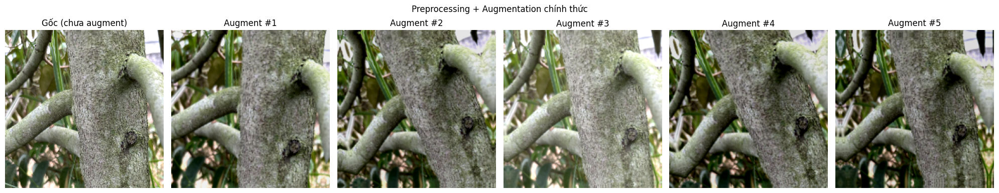


Đã chốt pipeline preprocessing + augmentation chính thức (make_dataset, AUGMENTATION_LAYERS).
Lưu ảnh minh hoạ tại: outputs/augmentation_preview.png (dùng cho báo cáo).


In [ ]:
import os
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import config, importlib
importlib.reload(config)

print("Cấu hình ảnh hiện tại (từ config.py):")
for attr in ["IMG_SIZE", "BATCH_SIZE", "SEED"]:
    print(f"  {attr:10s} = {getattr(config, attr, '(không tìm thấy trong config.py)')}")

# Augmentation CHÍNH THỨC — TÁI SỬ DỤNG trực tiếp build_augmentation_pipeline() từ
# data_preparation.py (nguồn DUY NHẤT, giống hệt cái train.py dùng để train 3 model
# chính), thay vì định nghĩa lại 1 bản Sequential riêng ở đây. Lý do: nếu định nghĩa
# lại, 2 bản dễ bị lệch tham số theo thời gian (ví dụ RandomRotation factor) khi 1 bên
# được chỉnh sửa còn bên kia quên cập nhật theo — khiến ablation augmentation KHÔNG còn
# so sánh đúng với augmentation thực tế dùng khi train model chính.
import data_preparation, importlib as _importlib
_importlib.reload(data_preparation)
from data_preparation import build_augmentation_pipeline

AUGMENTATION_LAYERS = build_augmentation_pipeline()


def make_dataset(directory, shuffle, augment):
    """Pipeline tf.data CHÍNH THỨC: load ảnh từ thư mục + (tuỳ chọn) augment.
    Dùng chung cho ablation augmentation và ablation freeze/fine-tune."""
    ds = tf.keras.utils.image_dataset_from_directory(
        directory, labels="inferred", label_mode="categorical",
        class_names=config.CLASS_NAMES, image_size=config.IMG_SIZE,
        batch_size=config.BATCH_SIZE, shuffle=shuffle, seed=config.SEED,
    )
    if augment:
        ds = ds.map(lambda x, y: (AUGMENTATION_LAYERS(x, training=True), y),
                    num_parallel_calls=tf.data.AUTOTUNE)
    return ds.prefetch(tf.data.AUTOTUNE)


# Trực quan hoá: 1 ảnh gốc + augmentation áp dụng nhiều lần khác nhau, để CHỐT phương án
# đưa vào báo cáo (chứng minh augmentation không làm biến dạng ảnh quá mức)
sample_ds = tf.keras.utils.image_dataset_from_directory(
    config.TRAIN_DIR, labels="inferred", label_mode="categorical",
    class_names=config.CLASS_NAMES, image_size=config.IMG_SIZE,
    batch_size=1, shuffle=True, seed=config.SEED,
)
sample_img, _ = next(iter(sample_ds.take(1)))

fig, axes = plt.subplots(1, 6, figsize=(20, 4))
axes[0].imshow(sample_img[0].numpy().astype("uint8"))
axes[0].set_title("Gốc (chưa augment)")
axes[0].axis("off")
for i in range(1, 6):
    augmented = AUGMENTATION_LAYERS(sample_img, training=True)
    axes[i].imshow(tf.clip_by_value(augmented[0], 0, 255).numpy().astype("uint8"))
    axes[i].set_title(f"Augment #{i}")
    axes[i].axis("off")
plt.suptitle("Preprocessing + Augmentation chính thức")
plt.tight_layout()
os.makedirs("outputs", exist_ok=True)
plt.savefig("outputs/augmentation_preview.png", dpi=120, bbox_inches="tight")
plt.show()

print("\nĐã chốt pipeline preprocessing + augmentation chính thức (make_dataset, AUGMENTATION_LAYERS).")
print("Lưu ảnh minh hoạ tại: outputs/augmentation_preview.png (dùng cho báo cáo).")


## 8b. Kết nối `outputs/` và `saved_models/` với Drive

Để kết quả (model đã train, biểu đồ, báo cáo) không bị mất khi Colab ngắt kết nối, ta trỏ 2 thư mục này thẳng vào Drive bằng symlink — mọi script (`train.py`, `evaluate.py`, `gradcam.py`) vẫn dùng đường dẫn tương đối `outputs/` / `saved_models/` như bình thường.

In [ ]:
import os, shutil

for name in ["outputs", "saved_models"]:
    local_path = os.path.join(CODE_DIR, name)
    drive_path = os.path.join(PROJECT_DIR, name)
    os.makedirs(drive_path, exist_ok=True)
    if os.path.islink(local_path):
        os.remove(local_path)
    elif os.path.isdir(local_path):
        # merge nội dung cũ (nếu có) vào Drive trước khi thay bằng symlink
        for item in os.listdir(local_path):
            s, d = os.path.join(local_path, item), os.path.join(drive_path, item)
            if not os.path.exists(d):
                shutil.move(s, d)
        shutil.rmtree(local_path)
    os.symlink(drive_path, local_path)
    print(f"{name}/  ->  {drive_path}")


outputs/  ->  /content/drive/MyDrive/durian_leaf/outputs
saved_models/  ->  /content/drive/MyDrive/durian_leaf/saved_models


## 8c. Resume-safe cache & provenance

Checkpoint/kết quả được lưu trên Google Drive.

In [ ]:
import os, json, hashlib
from pathlib import Path

CACHE_DIR = os.path.join(PROJECT_DIR, "cache")
ABLATION_MODEL_DIR = os.path.join(PROJECT_DIR, "saved_models", "ablation")
ABLATION_OUTPUT_DIR = os.path.join(PROJECT_DIR, "outputs", "ablation")
os.makedirs(CACHE_DIR, exist_ok=True)
os.makedirs(ABLATION_MODEL_DIR, exist_ok=True)
os.makedirs(ABLATION_OUTPUT_DIR, exist_ok=True)

FORCE = {
    "main_train": False,
    "evaluate": False,
    "ablation_1": False,
    "ablation_2": False,
    "gradcam": False,
}

def dataset_fingerprint():
    h = hashlib.sha256()
    n = 0
    for split in ("train", "validation", "test"):
        root = Path(DATA_DIR) / split
        for p in sorted(x for x in root.rglob("*")
                        if x.is_file() and x.suffix.lower() in VALID_EXTENSIONS):
            st = p.stat()
            rel = p.relative_to(DATA_DIR).as_posix()
            h.update(f"{rel}|{st.st_size}\n".encode())
            n += 1
    return h.hexdigest(), n

DATASET_FINGERPRINT, DATASET_TOTAL = dataset_fingerprint()
if DATASET_TOTAL != 5451:
    raise RuntimeError(f"Resume-safe guard: dataset={DATASET_TOTAL}, expected=5451")

def config_fingerprint(payload):
    return hashlib.sha256(
        json.dumps(payload, sort_keys=True, ensure_ascii=False).encode()
    ).hexdigest()

def load_json(path):
    with open(path, encoding="utf-8") as f:
        return json.load(f)

def save_json(path, obj):
    Path(path).parent.mkdir(parents=True, exist_ok=True)
    with open(path, "w", encoding="utf-8") as f:
        json.dump(obj, f, indent=2, ensure_ascii=False)

def artifact_valid(meta_path, experiment, cfg_fp):
    if not os.path.exists(meta_path):
        return False
    try:
        m = load_json(meta_path)
        return (
            m.get("dataset_total") == 5451
            and m.get("dataset_fingerprint") == DATASET_FINGERPRINT
            and m.get("experiment") == experiment
            and m.get("config_fingerprint") == cfg_fp
        )
    except Exception:
        return False

print("✓ Resume-safe initialized")
print("dataset_total:", DATASET_TOTAL)
print("dataset fingerprint:", DATASET_FINGERPRINT[:16] + "...")
print("FORCE:", FORCE)


✓ Resume-safe initialized
dataset_total: 5451
dataset fingerprint: 4b3944a68a35863b...
FORCE: {'main_train': False, 'evaluate': False, 'ablation_1': False, 'ablation_2': False, 'gradcam': False}


## 8c. Các phép biến đổi cơ bản trên ảnh

Minh họa các thao tác nền tảng của xử lý ảnh trước khi trích xuất đặc trưng và huấn luyện mô hình.

**Hình học:** resize, flip, rotation, center crop.  
**Cường độ/biên:** RGB→gray, Gaussian blur, CLAHE, Otsu threshold, Canny, morphological closing.

Các phép này phục vụ phân tích và minh họa kiến thức CS406; pipeline CNN chính vẫn dùng preprocessing/augmentation ở Mục 8.


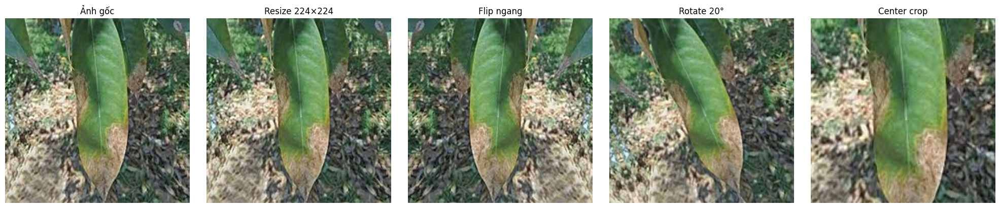

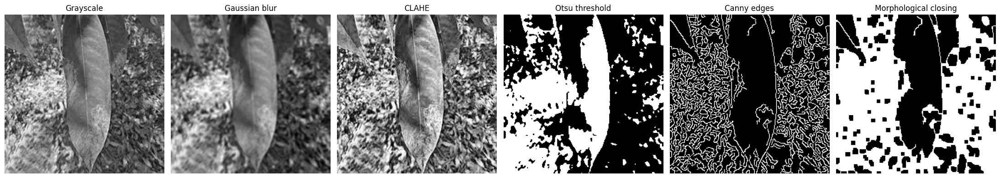

Ảnh minh họa: data/train/anthracnose_disease/093.jpg


In [ ]:
import cv2, glob, os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

_candidates=[]
for cls in config.CLASS_NAMES:
    _candidates += sorted(glob.glob(os.path.join(config.TRAIN_DIR, cls, '*')))
sample_transform_path = next(p for p in _candidates if os.path.isfile(p) and os.path.splitext(p)[1].lower() in VALID_EXTENSIONS)
img_rgb=np.array(Image.open(sample_transform_path).convert('RGB'))
h,w=img_rgb.shape[:2]
resized=cv2.resize(img_rgb,(224,224)); flipped=cv2.flip(img_rgb,1)
M=cv2.getRotationMatrix2D((w/2,h/2),20,1.0)
rotated=cv2.warpAffine(img_rgb,M,(w,h),flags=cv2.INTER_LINEAR,borderMode=cv2.BORDER_REFLECT)
cs=int(min(h,w)*0.70); y0=(h-cs)//2; x0=(w-cs)//2; crop=img_rgb[y0:y0+cs,x0:x0+cs]
fig,axes=plt.subplots(1,5,figsize=(20,4))
for ax,im,title in zip(axes,[img_rgb,resized,flipped,rotated,crop],['Ảnh gốc','Resize 224×224','Flip ngang','Rotate 20°','Center crop']):
    ax.imshow(im); ax.set_title(title); ax.axis('off')
plt.tight_layout(); os.makedirs('outputs',exist_ok=True); plt.savefig('outputs/basic_geometric_transforms.png',dpi=150,bbox_inches='tight'); plt.show()

gray=cv2.cvtColor(img_rgb,cv2.COLOR_RGB2GRAY); blur=cv2.GaussianBlur(gray,(5,5),0)
clahe=cv2.createCLAHE(clipLimit=2.0,tileGridSize=(8,8)).apply(gray)
_,otsu=cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
edges=cv2.Canny(blur,50,150); closing=cv2.morphologyEx(edges,cv2.MORPH_CLOSE,np.ones((5,5),np.uint8))
fig,axes=plt.subplots(1,6,figsize=(22,4))
for ax,im,title in zip(axes,[gray,blur,clahe,otsu,edges,closing],['Grayscale','Gaussian blur','CLAHE','Otsu threshold','Canny edges','Morphological closing']):
    ax.imshow(im,cmap='gray'); ax.set_title(title); ax.axis('off')
plt.tight_layout(); plt.savefig('outputs/basic_intensity_edge_transforms.png',dpi=150,bbox_inches='tight'); plt.show()
print('Ảnh minh họa:',sample_transform_path)


## 9. Mô tả ảnh và đặc trưng thị giác — toàn cục & cục bộ

| Nhóm | Ví dụ | Vai trò |
|---|---|---|
| **Đặc trưng toàn cục** | RGB Histogram, thống kê màu, GLCM | Mô tả màu/texture của toàn ảnh |
| **Đặc trưng cục bộ** | SIFT, SURF | Mô tả keypoint quanh đốm bệnh, biên tổn thương, texture cục bộ |

### 9.1 Color Histogram
Histogram RGB chuẩn hóa mô tả phân bố màu toàn ảnh.

### 9.2 GLCM Texture
GLCM mô tả Contrast, Correlation, Energy và Homogeneity.


In [ ]:
from skimage.feature import graycomatrix, graycoprops
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

IMAGE_PROCESSING_SPLIT = "train"
MAX_IMAGES_PER_CLASS_FOR_ANALYSIS = 100
HIST_BINS = 32
SEED = 42

def list_images_by_class(split_dir):
    out = {}
    for cls in class_dirs_in(split_dir):
        cls_dir = os.path.join(split_dir, cls)
        out[cls] = [
            os.path.join(cls_dir, f)
            for f in sorted(os.listdir(cls_dir))
            if is_real_file(cls_dir, f) and f.lower().endswith(VALID_EXT)
        ]
    return out

def load_rgb_uint8(path, size=(224, 224)):
    with Image.open(path) as img:
        img = img.convert("RGB").resize(size)
        return np.asarray(img, dtype=np.uint8)

def normalized_rgb_histogram(rgb, bins=HIST_BINS):
    feats = []
    for ch in range(3):
        hist, _ = np.histogram(
            rgb[..., ch],
            bins=bins,
            range=(0, 256),
            density=False
        )
        hist = hist.astype(np.float32)
        hist /= (hist.sum() + 1e-8)
        feats.extend(hist.tolist())
    return np.asarray(feats, dtype=np.float32)

def glcm_features(rgb):
    # luminance grayscale, uint8
    gray = (
        0.299 * rgb[..., 0] +
        0.587 * rgb[..., 1] +
        0.114 * rgb[..., 2]
    ).astype(np.uint8)

    # Giảm mức xám để GLCM nhẹ hơn nhưng vẫn giữ texture
    levels = 32
    gray_q = (gray // (256 // levels)).astype(np.uint8)

    glcm = graycomatrix(
        gray_q,
        distances=[1],
        angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
        levels=levels,
        symmetric=True,
        normed=True
    )

    return {
        "contrast": float(graycoprops(glcm, "contrast").mean()),
        "correlation": float(graycoprops(glcm, "correlation").mean()),
        "energy": float(graycoprops(glcm, "energy").mean()),
        "homogeneity": float(graycoprops(glcm, "homogeneity").mean()),
    }

def simple_color_stats(rgb):
    arr = rgb.astype(np.float32)
    return {
        "R_mean": float(arr[..., 0].mean()),
        "G_mean": float(arr[..., 1].mean()),
        "B_mean": float(arr[..., 2].mean()),
        "R_std": float(arr[..., 0].std()),
        "G_std": float(arr[..., 1].std()),
        "B_std": float(arr[..., 2].std()),
    }

analysis_split_dir = os.path.join(DATA_DIR, IMAGE_PROCESSING_SPLIT)
images_by_class = list_images_by_class(analysis_split_dir)

rows = []
class_histograms = {}

rng = np.random.default_rng(SEED)

for cls, paths in images_by_class.items():
    if len(paths) > MAX_IMAGES_PER_CLASS_FOR_ANALYSIS:
        idx = rng.choice(len(paths), MAX_IMAGES_PER_CLASS_FOR_ANALYSIS, replace=False)
        sample_paths = [paths[i] for i in sorted(idx)]
    else:
        sample_paths = paths

    hists = []

    for path in sample_paths:
        rgb = load_rgb_uint8(path)
        hist = normalized_rgb_histogram(rgb)
        glcm = glcm_features(rgb)
        color = simple_color_stats(rgb)

        row = {
            "class": cls,
            "file": os.path.basename(path),
            **color,
            **glcm,
        }
        rows.append(row)
        hists.append(hist)

    if hists:
        class_histograms[cls] = np.mean(np.stack(hists), axis=0)

df_features = pd.DataFrame(rows)

summary_cols = [
    "R_mean", "G_mean", "B_mean",
    "contrast", "correlation", "energy", "homogeneity"
]

df_feature_summary = (
    df_features
    .groupby("class")[summary_cols]
    .mean()
    .round(4)
)

os.makedirs("outputs", exist_ok=True)
df_features.to_csv("outputs/image_processing_features.csv", index=False)
df_feature_summary.to_csv("outputs/image_processing_summary_by_class.csv")

print("Đã lưu:")
print("- outputs/image_processing_features.csv")
print("- outputs/image_processing_summary_by_class.csv")

df_feature_summary


Đã lưu:
- outputs/image_processing_features.csv
- outputs/image_processing_summary_by_class.csv


,R_mean,G_mean,B_mean,contrast,correlation,energy,homogeneity
class,,,,,,,
anthracnose_disease,121.8218,134.3266,87.3507,7.9907,0.9068,0.0996,0.5289
canker_disease,123.0164,141.6072,82.8377,3.1143,0.9390,0.1450,0.6830
fruit_rot,119.7558,117.3390,91.5837,7.9119,0.9164,0.0922,0.4818
mealybug_infestation,120.6392,131.5513,88.5346,4.3601,0.9361,0.1455,0.6346
pink_disease,129.8006,136.0890,108.5351,8.4313,0.9002,0.0951,0.4920
sooty_mold,94.4023,99.5195,72.0023,5.5229,0.9166,0.1580,0.6268
stem_blight,117.7393,128.2356,85.3707,8.7092,0.8840,0.1049,0.5271
stem_cracking_gummosis,121.6070,117.8323,94.2089,6.9870,0.9134,0.1068,0.5132
thrips_disease,126.8807,144.9268,77.7835,2.2710,0.9327,0.1745,0.6834


### 9.3 Trực quan hóa đặc trưng màu và texture

Các biểu đồ dưới đây dùng để **phân tích**, không phải để tạo thêm dữ liệu.

- Histogram màu trung bình theo lớp.
- So sánh các chỉ số GLCM trung bình giữa các lớp.


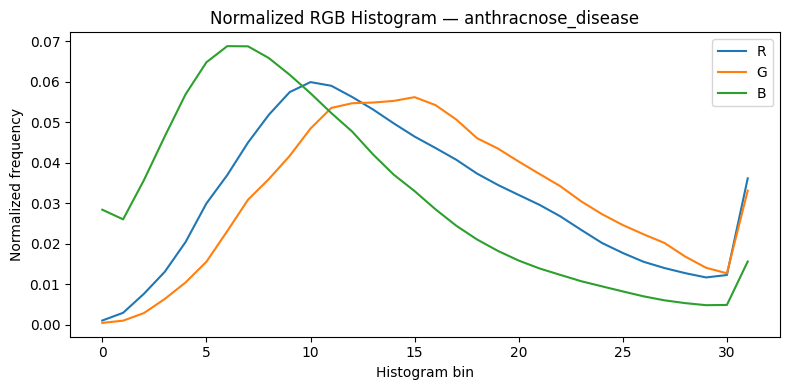

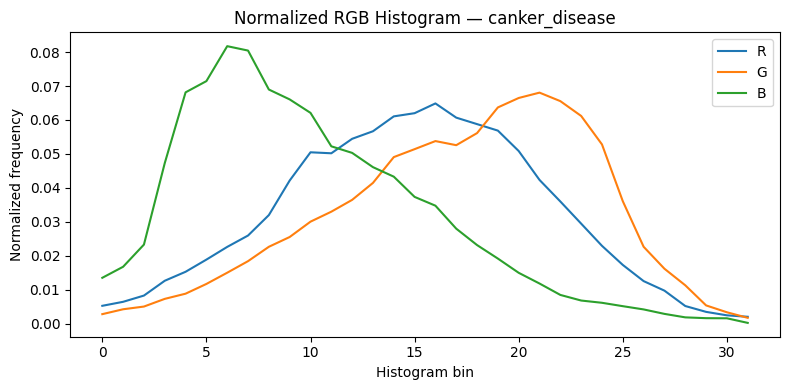

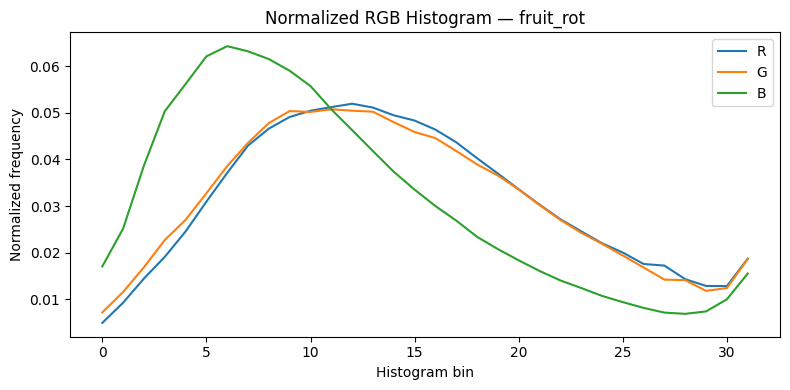

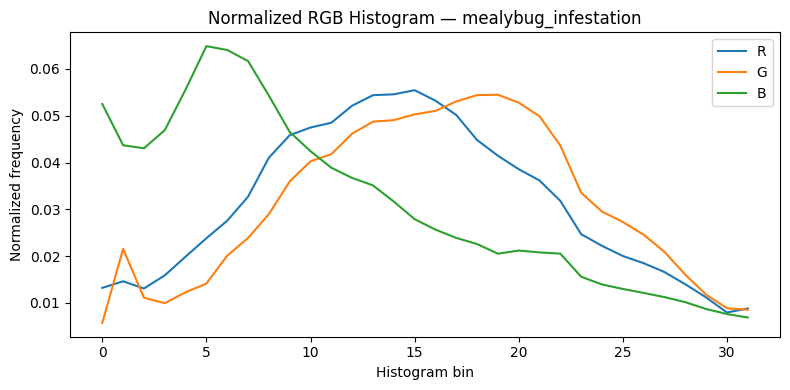

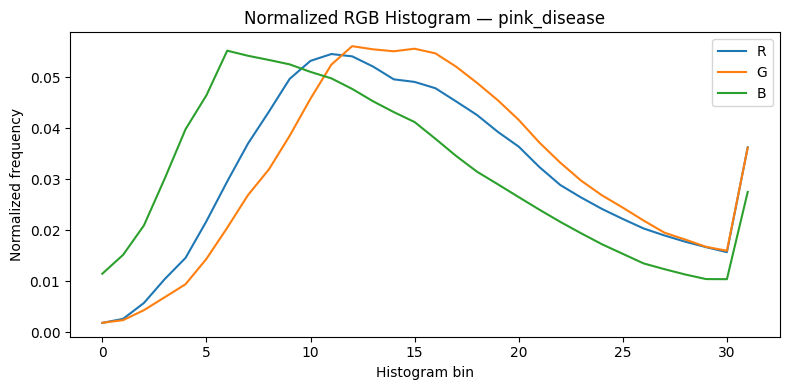

...

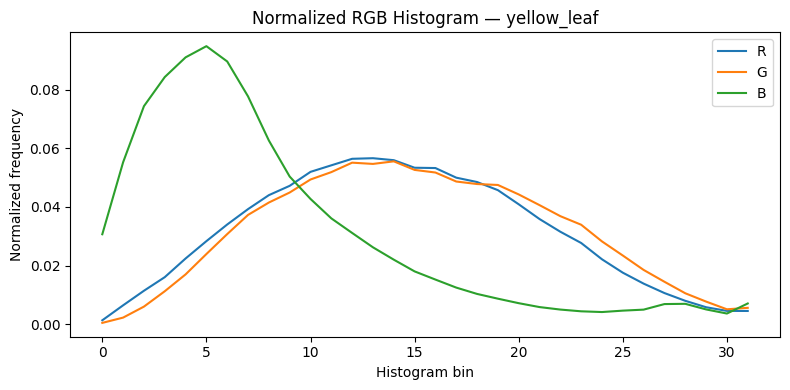

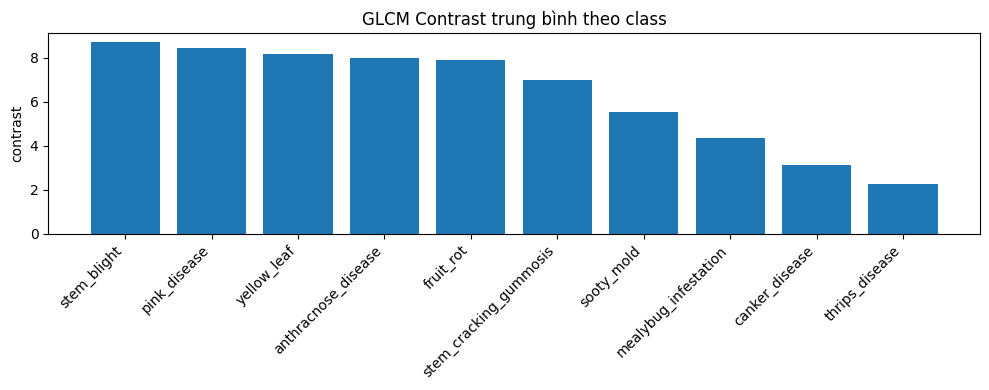

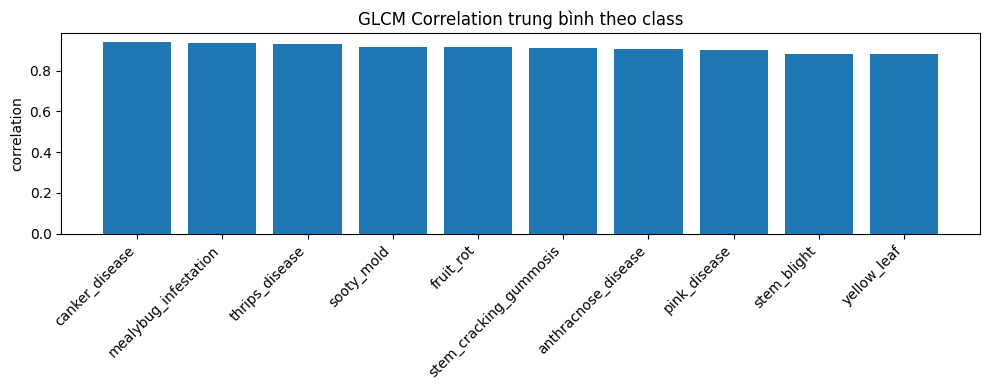

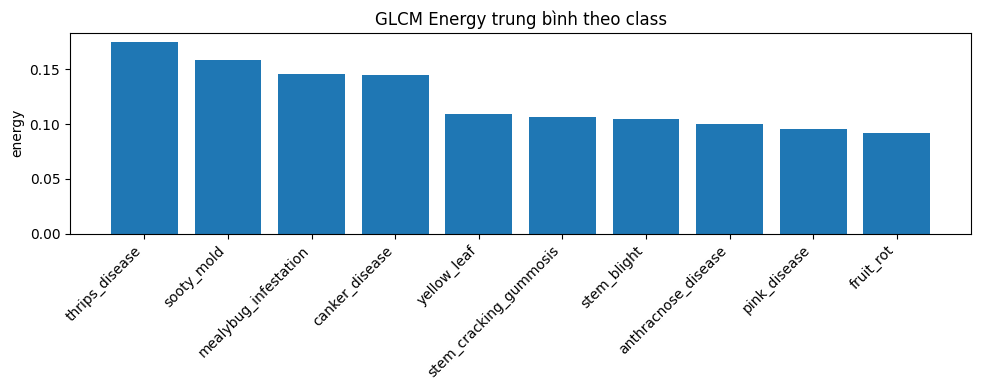

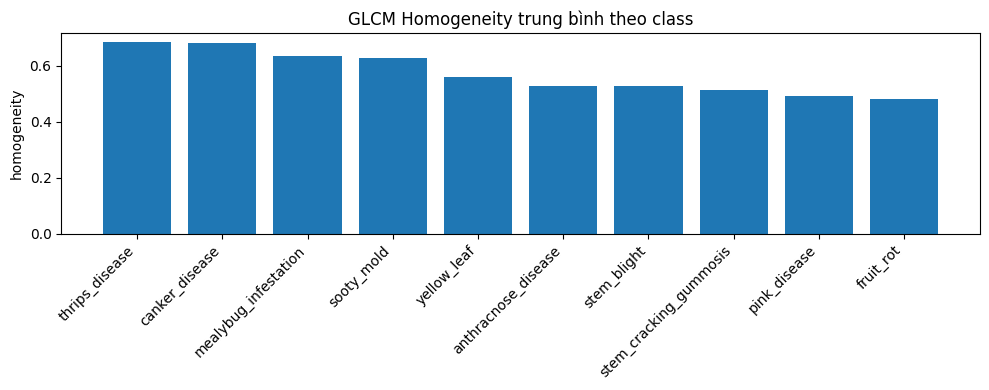

In [ ]:
# Vẽ RGB histogram trung bình của từng class
for cls, hist in class_histograms.items():
    bins = HIST_BINS
    x = np.arange(bins)

    plt.figure(figsize=(8, 4))
    plt.plot(x, hist[0:bins], label="R")
    plt.plot(x, hist[bins:2*bins], label="G")
    plt.plot(x, hist[2*bins:3*bins], label="B")
    plt.title(f"Normalized RGB Histogram — {cls}")
    plt.xlabel("Histogram bin")
    plt.ylabel("Normalized frequency")
    plt.legend()
    plt.tight_layout()
    plt.show()

# GLCM summary plots
for metric in ["contrast", "correlation", "energy", "homogeneity"]:
    values = df_feature_summary[metric].sort_values(ascending=False)

    plt.figure(figsize=(10, 4))
    plt.bar(values.index, values.values)
    plt.title(f"GLCM {metric.capitalize()} trung bình theo class")
    plt.ylabel(metric)
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()


### 9.4 Cách diễn giải cho báo cáo

 Phần này dùng để mô tả xu hướng:

- Histogram RGB phản ánh sự thay đổi màu do vàng lá, nâu hóa, đốm bệnh hoặc vùng hoại tử.
- GLCM contrast cao thường gợi ý texture biến đổi mạnh hơn.
- Energy/homogeneity cao thường gợi ý vùng ảnh đồng đều hơn.
- Nếu các lớp chồng lấn mạnh ở handcrafted features, đó là lý do hợp lý để dùng CNN:
  CNN có thể học đồng thời màu sắc, texture, hình dạng và cấu trúc không gian phức tạp hơn.




### 9.5 Đặc trưng cục bộ — SIFT / SURF

**SIFT** phát hiện keypoint và descriptor bền tương đối với thay đổi tỉ lệ/xoay.

**SURF** có mục tiêu tương tự nhưng nhiều OpenCV build không bật `nonfree`, nên notebook kiểm tra trước và không crash nếu không hỗ trợ.


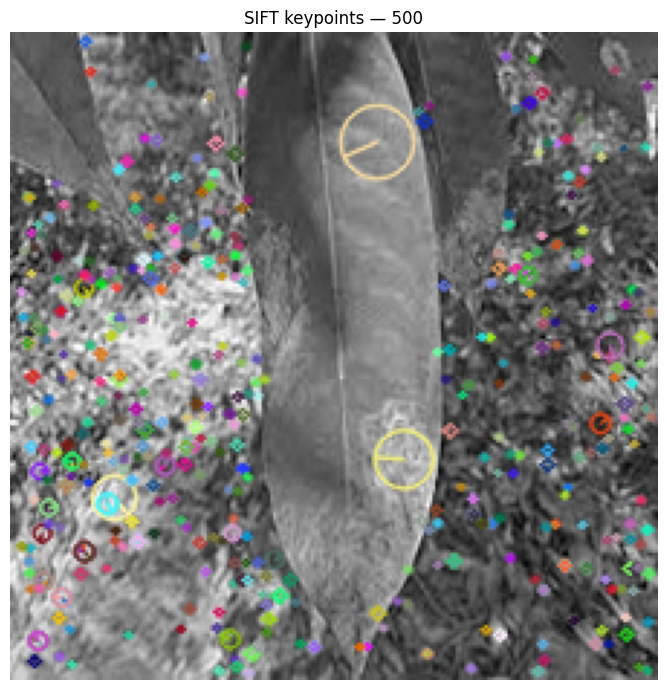

[SIFT] descriptor: (500, 128)
[SURF] OpenCV build không có SURF_create.


In [ ]:
import cv2, numpy as np, matplotlib.pyplot as plt

def read_gray_cv(path,max_side=900):
    img=cv2.imread(path,cv2.IMREAD_GRAYSCALE)
    if img is None: raise ValueError(f'Không đọc được ảnh: {path}')
    h,w=img.shape; scale=min(1.0,max_side/max(h,w))
    if scale<1: img=cv2.resize(img,(int(w*scale),int(h*scale)),interpolation=cv2.INTER_AREA)
    return img

def extract_sift(path,nfeatures=500):
    gray=read_gray_cv(path); sift=cv2.SIFT_create(nfeatures=nfeatures); kp,des=sift.detectAndCompute(gray,None); return gray,kp,des

def try_extract_surf(path,hessian_threshold=400):
    gray=read_gray_cv(path)
    if not hasattr(cv2,'xfeatures2d') or not hasattr(cv2.xfeatures2d,'SURF_create'):
        return gray,None,None,'OpenCV build không có SURF_create.'
    try:
        surf=cv2.xfeatures2d.SURF_create(hessianThreshold=hessian_threshold); kp,des=surf.detectAndCompute(gray,None); return gray,kp,des,None
    except cv2.error as e:
        return gray,None,None,'SURF có trong API nhưng build hiện tại không bật nonfree.'

gray_demo,kp_sift,des_sift=extract_sift(sample_transform_path)
vis=cv2.drawKeypoints(gray_demo,kp_sift,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(9,7)); plt.imshow(vis,cmap='gray'); plt.title(f'SIFT keypoints — {len(kp_sift)}'); plt.axis('off'); plt.tight_layout(); plt.savefig('outputs/sift_keypoints.png',dpi=150,bbox_inches='tight'); plt.show()
_,kp_surf,des_surf,surf_error=try_extract_surf(sample_transform_path)
print('[SIFT] descriptor:',None if des_sift is None else des_sift.shape)
print('[SURF]', surf_error if surf_error else f'{len(kp_surf)} keypoints')


### 9.6 Nhận dạng dựa trên đặc trưng cục bộ — SIFT matching

So khớp hai ảnh cùng lớp và hai ảnh khác lớp bằng KNN + Lowe ratio test để minh họa classical object/image recognition dựa trên keypoint.


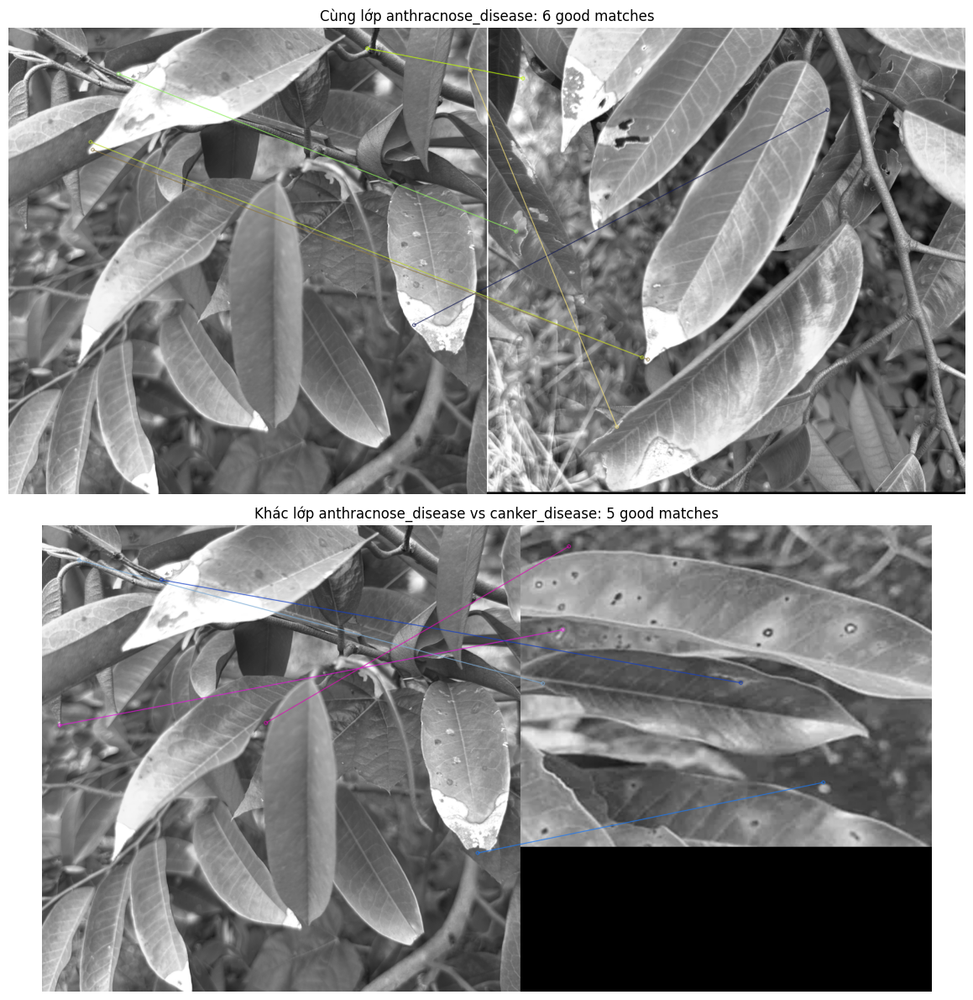

,pair,class_1,class_2,good_matches,keypoints_1,keypoints_2
0,same_class,anthracnose_disease,anthracnose_disease,6,500,500
1,different_class,anthracnose_disease,canker_disease,5,500,500


In [ ]:
def valid_images_of_class(split_dir,cls):
    d=os.path.join(split_dir,cls)
    return [os.path.join(d,f) for f in sorted(os.listdir(d)) if os.path.isfile(os.path.join(d,f)) and os.path.splitext(f)[1].lower() in VALID_EXTENSIONS and not f.startswith('.')]

same_cls=next(cls for cls in config.CLASS_NAMES if len(valid_images_of_class(config.TEST_DIR,cls))>=2)
same_paths=valid_images_of_class(config.TEST_DIR,same_cls)[:2]
diff_cls=next(cls for cls in config.CLASS_NAMES if cls!=same_cls and len(valid_images_of_class(config.TEST_DIR,cls))>=1)
diff_path=valid_images_of_class(config.TEST_DIR,diff_cls)[0]

def sift_match(p1,p2,ratio=0.75,max_draw=40):
    g1,k1,d1=extract_sift(p1); g2,k2,d2=extract_sift(p2)
    if d1 is None or d2 is None: return {'good_matches':0,'keypoints_1':len(k1),'keypoints_2':len(k2),'image':np.hstack([cv2.resize(g1,(300,300)),cv2.resize(g2,(300,300))])}
    knn=cv2.BFMatcher(cv2.NORM_L2).knnMatch(d1,d2,k=2); good=[m for m,n in knn if m.distance<ratio*n.distance]
    im=cv2.drawMatches(g1,k1,g2,k2,sorted(good,key=lambda m:m.distance)[:max_draw],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    return {'good_matches':len(good),'keypoints_1':len(k1),'keypoints_2':len(k2),'image':im}

same=sift_match(same_paths[0],same_paths[1]); diff=sift_match(same_paths[0],diff_path)
fig,axes=plt.subplots(2,1,figsize=(16,12))
axes[0].imshow(same['image'],cmap='gray'); axes[0].set_title(f'Cùng lớp {same_cls}: {same["good_matches"]} good matches'); axes[0].axis('off')
axes[1].imshow(diff['image'],cmap='gray'); axes[1].set_title(f'Khác lớp {same_cls} vs {diff_cls}: {diff["good_matches"]} good matches'); axes[1].axis('off')
plt.tight_layout(); plt.savefig('outputs/sift_matching_same_vs_different.png',dpi=150,bbox_inches='tight'); plt.show()

df_sift_match_demo=pd.DataFrame([
 {'pair':'same_class','class_1':same_cls,'class_2':same_cls,'good_matches':same['good_matches'],'keypoints_1':same['keypoints_1'],'keypoints_2':same['keypoints_2']},
 {'pair':'different_class','class_1':same_cls,'class_2':diff_cls,'good_matches':diff['good_matches'],'keypoints_1':diff['keypoints_1'],'keypoints_2':diff['keypoints_2']},
]); df_sift_match_demo.to_csv('outputs/sift_matching_demo.csv',index=False); df_sift_match_demo


### 9.7 Baseline — RGB Histogram + GLCM + SVM

Để phần **Xử lý ảnh** của CS406 có đánh giá định lượng,
**RGB Histogram (32 bins × 3 kênh) + GLCM (4 thuộc tính) + thống kê màu (mean/std) → StandardScaler → SVM-RBF.**

 Mục đích là so sánh handcrafted features với đặc trưng học tự động bằng Deep Learning trên **cùng train/validation/test split**.


Handcrafted feature shape:
  train: (4154, 106)
  val  : (649, 106)
  test : (648, 106)
C=1  -> validation accuracy = 0.6117
C=10 -> validation accuracy = 0.6749

Best C theo validation: 10.0


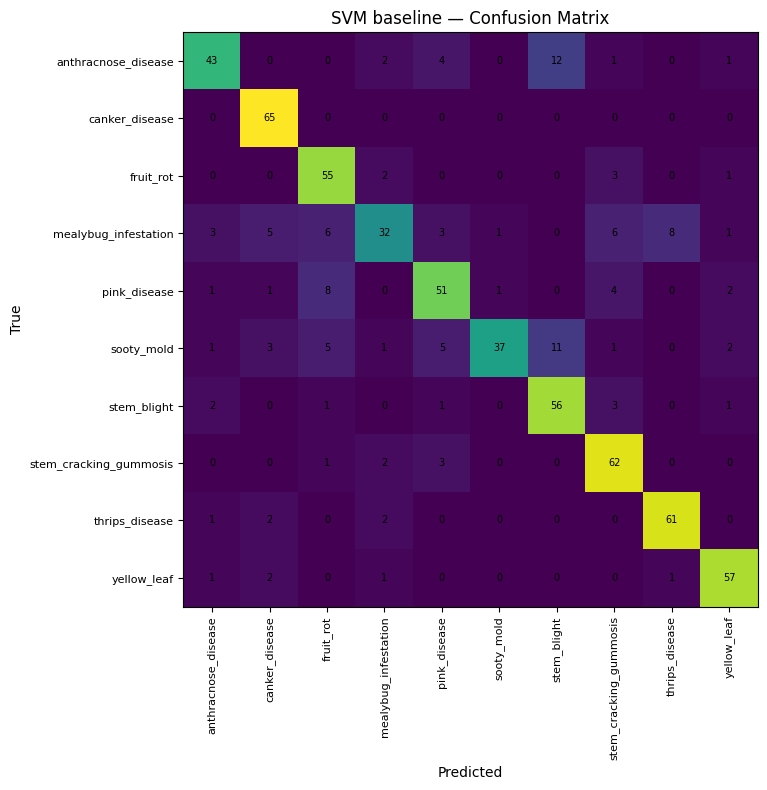


SVM handcrafted baseline:
accuracy              0.800926
macro_precision       0.808797
macro_recall          0.801745
macro_f1              0.793404
best_C               10.000000
n_train            4154.000000
n_validation        649.000000
n_test              648.000000
dtype: float64

Classification report:

                        precision    recall  f1-score   support

   anthracnose_disease       0.83      0.68      0.75        63
        canker_disease       0.83      1.00      0.91        65
             fruit_rot       0.72      0.90      0.80        61
  mealybug_infestation       0.76      0.49      0.60        65
          pink_disease       0.76      0.75      0.76        68
            sooty_mold       0.95      0.56      0.70        66
           stem_blight       0.71      0.88      0.78        64
stem_cracking_gummosis       0.78      0.91      0.84        68
        thrips_disease       0.87      0.92      0.90        66
           yellow_leaf       0.88      0.92 

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import (
    accuracy_score, precision_recall_fscore_support,
    classification_report, confusion_matrix
)
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def handcrafted_vector(path):
    rgb = load_rgb_uint8(path)
    hist = normalized_rgb_histogram(rgb)
    glcm = glcm_features(rgb)
    color = simple_color_stats(rgb)

    extra = np.array([
        color["R_mean"], color["G_mean"], color["B_mean"],
        color["R_std"], color["G_std"], color["B_std"],
        glcm["contrast"], glcm["correlation"],
        glcm["energy"], glcm["homogeneity"],
    ], dtype=np.float32)

    return np.concatenate([hist, extra], axis=0)

def build_handcrafted_split(split_dir):
    X, y = [], []
    for class_idx, cls in enumerate(config.CLASS_NAMES):
        cls_dir = os.path.join(split_dir, cls)
        if not os.path.isdir(cls_dir):
            continue
        for fname in sorted(os.listdir(cls_dir)):
            path = os.path.join(cls_dir, fname)
            if (
                os.path.isfile(path)
                and not fname.startswith(".")
                and os.path.splitext(fname)[1].lower() in VALID_EXTENSIONS
            ):
                X.append(handcrafted_vector(path))
                y.append(class_idx)
    return np.asarray(X, dtype=np.float32), np.asarray(y, dtype=np.int64)

X_train_h, y_train_h = build_handcrafted_split(config.TRAIN_DIR)
X_val_h, y_val_h = build_handcrafted_split(config.VAL_DIR)
X_test_h, y_test_h = build_handcrafted_split(config.TEST_DIR)

print("Handcrafted feature shape:")
print("  train:", X_train_h.shape)
print("  val  :", X_val_h.shape)
print("  test :", X_test_h.shape)

# C được chọn bằng validation, tuyệt đối không dùng test để tune.
candidate_C = [1, 10]
val_rows = []

for C in candidate_C:
    svm_tmp = Pipeline([
        ("scaler", StandardScaler()),
        ("svm", SVC(kernel="rbf", C=C, gamma="scale", class_weight="balanced"))
    ])
    svm_tmp.fit(X_train_h, y_train_h)
    val_pred = svm_tmp.predict(X_val_h)
    val_acc = accuracy_score(y_val_h, val_pred)
    val_rows.append({"C": C, "val_accuracy": val_acc})
    print(f"C={C:<2} -> validation accuracy = {val_acc:.4f}")

df_svm_val = pd.DataFrame(val_rows)
best_C = float(df_svm_val.sort_values("val_accuracy", ascending=False).iloc[0]["C"])
print("\nBest C theo validation:", best_C)

# Sau khi chốt hyperparameter bằng validation, fit lại bằng train + validation.
X_trainval_h = np.concatenate([X_train_h, X_val_h], axis=0)
y_trainval_h = np.concatenate([y_train_h, y_val_h], axis=0)

svm_model = Pipeline([
    ("scaler", StandardScaler()),
    ("svm", SVC(kernel="rbf", C=best_C, gamma="scale", class_weight="balanced"))
])
svm_model.fit(X_trainval_h, y_trainval_h)

svm_pred = svm_model.predict(X_test_h)

svm_acc = accuracy_score(y_test_h, svm_pred)
svm_p, svm_r, svm_f1, _ = precision_recall_fscore_support(
    y_test_h, svm_pred, average="macro", zero_division=0
)

svm_results = {
    "accuracy": float(svm_acc),
    "macro_precision": float(svm_p),
    "macro_recall": float(svm_r),
    "macro_f1": float(svm_f1),
    "best_C": best_C,
    "n_train": int(len(y_train_h)),
    "n_validation": int(len(y_val_h)),
    "n_test": int(len(y_test_h)),
}

os.makedirs("outputs", exist_ok=True)
with open("outputs/svm_handcrafted_test_results.json", "w") as f:
    json.dump(svm_results, f, indent=2)

report = classification_report(
    y_test_h, svm_pred,
    labels=list(range(len(config.CLASS_NAMES))),
    target_names=config.CLASS_NAMES,
    zero_division=0
)
with open("outputs/svm_handcrafted_classification_report.txt", "w") as f:
    f.write(report)

cm_svm = confusion_matrix(
    y_test_h, svm_pred,
    labels=list(range(len(config.CLASS_NAMES)))
)
fig, ax = plt.subplots(figsize=(10, 8))
im = ax.imshow(cm_svm)
ax.set_title("SVM baseline — Confusion Matrix")
ax.set_xlabel("Predicted")
ax.set_ylabel("True")
ax.set_xticks(range(len(config.CLASS_NAMES)))
ax.set_yticks(range(len(config.CLASS_NAMES)))
ax.set_xticklabels(config.CLASS_NAMES, rotation=90, fontsize=8)
ax.set_yticklabels(config.CLASS_NAMES, fontsize=8)
for i in range(cm_svm.shape[0]):
    for j in range(cm_svm.shape[1]):
        ax.text(j, i, cm_svm[i, j], ha="center", va="center", fontsize=7)
plt.tight_layout()
plt.savefig("outputs/svm_handcrafted_confusion_matrix.png", dpi=150)
plt.show()

print("\nSVM handcrafted baseline:")
print(pd.Series(svm_results))
print("\nClassification report:\n")
print(report)


## 10. Huấn luyện 3 kiến trúc CNN (Transfer Learning, 2 giai đoạn)





In [ ]:
# ============================================================
# HARD GUARD BEFORE TRAINING — DISTRIBUTED DATASET 5,451 IMAGES
# ============================================================

import os
from pathlib import Path

# Dataset thực tế trong Durian_Diseases.zip
# Published description: 5,452
# Distributed archive:   5,451 = 4,154 + 649 + 648
EXPECTED_DISTRIBUTED_TOTAL = 5451
PUBLISHED_TOTAL = 5452

EXPECTED_SPLIT = {
    "train": 4154,
    "validation": 649,
    "test": 648,
}

# Lấy đường dẫn từ config sau khi source/config đã được chuẩn bị
split_dirs = {
    "train": Path(config.TRAIN_DIR),
    "validation": Path(config.VAL_DIR),
    "test": Path(config.TEST_DIR),
}

# ------------------------------------------------------------
# 1. Đếm số ảnh thực tế
# ------------------------------------------------------------
split_counts = {}

for name, d in split_dirs.items():

    if not d.exists():
        raise FileNotFoundError(
            f"Thiếu split {name}: {d}"
        )

    split_counts[name] = len([
        p for p in d.rglob("*")
        if (
            p.is_file()
            and p.suffix.lower() in VALID_IMAGE_EXTS
            and "__MACOSX" not in p.parts
        )
    ])

total_processed = sum(split_counts.values())

# ------------------------------------------------------------
# 2. Hiển thị reconciliation
# ------------------------------------------------------------
print("Dataset dùng cho experiment:")

for k, v in split_counts.items():
    print(f"  {k:10s}: {v:,}")

print(f"  {'TOTAL':10s}: {total_processed:,}")
print(f"  EXPECTED   : {EXPECTED_DISTRIBUTED_TOTAL:,}")
print(f"  PUBLISHED  : {PUBLISHED_TOTAL:,}")

# ------------------------------------------------------------
# 3. HARD GUARD — kiểm tra từng split
# ------------------------------------------------------------
if split_counts != EXPECTED_SPLIT:

    raise RuntimeError(
        "STOP TRAINING: số lượng ảnh của các split không đúng.\n"
        f"Actual   : {split_counts}\n"
        f"Expected : {EXPECTED_SPLIT}"
    )

# ------------------------------------------------------------
# 4. HARD GUARD — kiểm tra tổng
# ------------------------------------------------------------
if total_processed != EXPECTED_DISTRIBUTED_TOTAL:

    raise RuntimeError(
        f"STOP TRAINING: dataset hiện có {total_processed:,} ảnh, "
        f"expected {EXPECTED_DISTRIBUTED_TOTAL:,} ảnh theo "
        "distributed archive."
    )

# ------------------------------------------------------------
# 5. Không cho phép ảnh corrupt bị bỏ qua âm thầm
# ------------------------------------------------------------
all_paths = []

for d in split_dirs.values():
    all_paths.extend(list_images(d))

bad = verify_readable(all_paths)

if bad:

    print("\nẢnh không đọc được:")

    for x in bad[:20]:
        print(" -", x)

    raise RuntimeError(
        f"STOP TRAINING: phát hiện {len(bad)} ảnh không đọc được. "
        "Hãy kiểm tra nguồn dữ liệu thay vì tự động xóa."
    )

# ------------------------------------------------------------
# 6. PASS
# ------------------------------------------------------------
print("\n✓ HARD GUARD PASSED")
print("✓ Dataset thực nghiệm: 5,451 ảnh")
print("✓ Train      : 4,154")
print("✓ Validation : 649")
print("✓ Test       : 648")
print("✓ Tất cả ảnh đều đọc được.")
print()
print(
    "Ghi chú: mô tả dataset công bố 5,452 ảnh, "
    "nhưng distributed archive sử dụng trong experiment "
    "chứa 5,451 ảnh hợp lệ (chênh 1 ảnh validation)."
)
print()
print("✓ Có thể bắt đầu EDA / training / evaluation.")

Dataset dùng cho experiment:
  train     : 4,154
  validation: 649
  test      : 648
  TOTAL     : 5,451
  EXPECTED   : 5,451
  PUBLISHED  : 5,452

✓ HARD GUARD PASSED
✓ Dataset thực nghiệm: 5,451 ảnh
✓ Train      : 4,154
✓ Validation : 649
✓ Test       : 648
✓ Tất cả ảnh đều đọc được.

Ghi chú: mô tả dataset công bố 5,452 ảnh, nhưng distributed archive sử dụng trong experiment chứa 5,451 ảnh hợp lệ (chênh 1 ảnh validation).

✓ Có thể bắt đầu EDA / training / evaluation.


In [ ]:
import os, subprocess, sys

MODEL_NAME = "efficientnet"
best_path = os.path.join(CODE_DIR, "saved_models", f"{MODEL_NAME}_best.keras")
final_path = os.path.join(CODE_DIR, "saved_models", f"{MODEL_NAME}_final.keras")
meta_path = os.path.join(CODE_DIR, "outputs", f"{MODEL_NAME}_resume_metadata.json")

train_cfg = {
    "model": MODEL_NAME, "epochs": 30, "batch_size": 32,
    "use_class_weights": True, "img_size": list(config.IMG_SIZE),
    "seed": int(config.SEED)
}
cfg_fp = config_fingerprint(train_cfg)

valid = (
    os.path.exists(best_path) and os.path.exists(final_path)
    and artifact_valid(meta_path, f"main_train:{MODEL_NAME}", cfg_fp)
)

if valid and not FORCE["main_train"]:
    print(f"✓ {MODEL_NAME}: checkpoint 5,451 hợp lệ -> SKIP TRAIN")
else:
    if os.path.exists(best_path) or os.path.exists(final_path):
        print(f"[!] {MODEL_NAME}: checkpoint cũ/không đúng provenance -> TRAIN LẠI")
    subprocess.run([
        sys.executable, "train.py", "--model", MODEL_NAME,
        "--epochs", "30", "--batch_size", "32", "--use_class_weights"
    ], cwd=CODE_DIR, check=True)
    if not (os.path.exists(best_path) and os.path.exists(final_path)):
        raise RuntimeError(f"{MODEL_NAME}: thiếu best/final sau train")
    save_json(meta_path, {
        "experiment": f"main_train:{MODEL_NAME}",
        "dataset_total": 5451,
        "dataset_fingerprint": DATASET_FINGERPRINT,
        "config": train_cfg,
        "config_fingerprint": cfg_fp
    })
    print(f"✓ {MODEL_NAME}: saved checkpoint + provenance")


✓ efficientnet: checkpoint 5,451 hợp lệ -> SKIP TRAIN


In [ ]:
import os, subprocess, sys

MODEL_NAME = "resnet50"
best_path = os.path.join(CODE_DIR, "saved_models", f"{MODEL_NAME}_best.keras")
final_path = os.path.join(CODE_DIR, "saved_models", f"{MODEL_NAME}_final.keras")
meta_path = os.path.join(CODE_DIR, "outputs", f"{MODEL_NAME}_resume_metadata.json")

train_cfg = {
    "model": MODEL_NAME, "epochs": 30, "batch_size": 32,
    "use_class_weights": True, "img_size": list(config.IMG_SIZE),
    "seed": int(config.SEED)
}
cfg_fp = config_fingerprint(train_cfg)

valid = (
    os.path.exists(best_path) and os.path.exists(final_path)
    and artifact_valid(meta_path, f"main_train:{MODEL_NAME}", cfg_fp)
)

if valid and not FORCE["main_train"]:
    print(f"✓ {MODEL_NAME}: checkpoint 5,451 hợp lệ -> SKIP TRAIN")
else:
    if os.path.exists(best_path) or os.path.exists(final_path):
        print(f"[!] {MODEL_NAME}: checkpoint cũ/không đúng provenance -> TRAIN LẠI")
    subprocess.run([
        sys.executable, "train.py", "--model", MODEL_NAME,
        "--epochs", "30", "--batch_size", "32", "--use_class_weights"
    ], cwd=CODE_DIR, check=True)
    if not (os.path.exists(best_path) and os.path.exists(final_path)):
        raise RuntimeError(f"{MODEL_NAME}: thiếu best/final sau train")
    save_json(meta_path, {
        "experiment": f"main_train:{MODEL_NAME}",
        "dataset_total": 5451,
        "dataset_fingerprint": DATASET_FINGERPRINT,
        "config": train_cfg,
        "config_fingerprint": cfg_fp
    })
    print(f"✓ {MODEL_NAME}: saved checkpoint + provenance")


✓ resnet50: checkpoint 5,451 hợp lệ -> SKIP TRAIN


In [ ]:
import os, subprocess, sys

MODEL_NAME = "mobilenet"
best_path = os.path.join(CODE_DIR, "saved_models", f"{MODEL_NAME}_best.keras")
final_path = os.path.join(CODE_DIR, "saved_models", f"{MODEL_NAME}_final.keras")
meta_path = os.path.join(CODE_DIR, "outputs", f"{MODEL_NAME}_resume_metadata.json")

train_cfg = {
    "model": MODEL_NAME, "epochs": 30, "batch_size": 32,
    "use_class_weights": True, "img_size": list(config.IMG_SIZE),
    "seed": int(config.SEED)
}
cfg_fp = config_fingerprint(train_cfg)

valid = (
    os.path.exists(best_path) and os.path.exists(final_path)
    and artifact_valid(meta_path, f"main_train:{MODEL_NAME}", cfg_fp)
)

if valid and not FORCE["main_train"]:
    print(f"✓ {MODEL_NAME}: checkpoint 5,451 hợp lệ -> SKIP TRAIN")
else:
    if os.path.exists(best_path) or os.path.exists(final_path):
        print(f"[!] {MODEL_NAME}: checkpoint cũ/không đúng provenance -> TRAIN LẠI")
    subprocess.run([
        sys.executable, "train.py", "--model", MODEL_NAME,
        "--epochs", "30", "--batch_size", "32", "--use_class_weights"
    ], cwd=CODE_DIR, check=True)
    if not (os.path.exists(best_path) and os.path.exists(final_path)):
        raise RuntimeError(f"{MODEL_NAME}: thiếu best/final sau train")
    save_json(meta_path, {
        "experiment": f"main_train:{MODEL_NAME}",
        "dataset_total": 5451,
        "dataset_fingerprint": DATASET_FINGERPRINT,
        "config": train_cfg,
        "config_fingerprint": cfg_fp
    })
    print(f"✓ {MODEL_NAME}: saved checkpoint + provenance")


✓ mobilenet: checkpoint 5,451 hợp lệ -> SKIP TRAIN


## 11. Đánh giá & so sánh 3 model



In [ ]:
import os, sys, subprocess, json
import numpy as np
import tensorflow as tf
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

os.chdir(CODE_DIR)

REQUIRED_METRICS = {
    "accuracy", "macro_precision", "macro_recall", "macro_f1"
}

def _result_has_macro_metrics(path):
    if not os.path.exists(path):
        return False
    try:
        with open(path, "r", encoding="utf-8") as f:
            r = json.load(f)
        return REQUIRED_METRICS.issubset(r.keys())
    except Exception:
        return False

def _repair_macro_metrics(model_name, result_path):
    """
    evaluate.py cũ có thể chỉ ghi accuracy/precision/recall.
    Hàm này dùng checkpoint hiện có và test split 648 ảnh để tính đúng
    macro Precision/Recall/F1, rồi cập nhật JSON. KHÔNG train lại model.
    """
    best_path = os.path.join("saved_models", f"{model_name}_best.keras")
    final_path = os.path.join("saved_models", f"{model_name}_final.keras")

    if os.path.exists(best_path):
        model_path = best_path
    elif os.path.exists(final_path):
        model_path = final_path
    else:
        raise FileNotFoundError(
            f"Không tìm thấy checkpoint cho {model_name}: "
            f"{best_path} hoặc {final_path}"
        )

    print(f"→ Tính macro metrics từ checkpoint: {model_path}")

    model = tf.keras.models.load_model(model_path)
    test_ds = make_dataset(
        config.TEST_DIR,
        shuffle=False,
        augment=False
    )

    y_true, y_pred = [], []
    losses = []

    # evaluate loss/accuracy một lần trên cùng test set
    eval_out = model.evaluate(test_ds, verbose=0, return_dict=True)

    for images, labels in test_ds:
        probs = model.predict(images, verbose=0)
        y_true.extend(np.argmax(labels.numpy(), axis=1))
        y_pred.extend(np.argmax(probs, axis=1))

    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    if len(y_true) != 648:
        raise RuntimeError(
            f"{model_name}: test set có {len(y_true)} ảnh, expected 648."
        )

    repaired = {}
    if os.path.exists(result_path):
        try:
            with open(result_path, "r", encoding="utf-8") as f:
                repaired = json.load(f)
        except Exception:
            repaired = {}

    repaired.update({
        "accuracy": float(accuracy_score(y_true, y_pred)),
        "macro_precision": float(
            precision_score(y_true, y_pred, average="macro", zero_division=0)
        ),
        "macro_recall": float(
            recall_score(y_true, y_pred, average="macro", zero_division=0)
        ),
        "macro_f1": float(
            f1_score(y_true, y_pred, average="macro", zero_division=0)
        ),
        "loss": float(eval_out["loss"]) if "loss" in eval_out else repaired.get("loss"),
        "checkpoint": os.path.basename(model_path),
        "n_test": int(len(y_true)),
        "metrics_version": 2,
    })

    os.makedirs(os.path.dirname(result_path), exist_ok=True)
    with open(result_path, "w", encoding="utf-8") as f:
        json.dump(repaired, f, indent=2, ensure_ascii=False)

    print(
        f"✓ {model_name}: đã cập nhật accuracy + "
        "macro_precision + macro_recall + macro_f1"
    )
    return repaired


for m in ["efficientnet", "resnet50", "mobilenet"]:
    result_path = os.path.join("outputs", f"{m}_test_results.json")
    meta_path = os.path.join(
        "outputs", f"{m}_evaluation_resume_metadata.json"
    )

    cfg = {
        "model": m,
        "img_size": list(config.IMG_SIZE),
        "seed": int(config.SEED),
        "metrics_version": 2,
        "test_size": 648,
    }
    fp = config_fingerprint(cfg)

    result_valid = _result_has_macro_metrics(result_path)
    meta_valid = artifact_valid(
        meta_path, f"evaluate:{m}", fp
    )

    if (
        result_valid
        and meta_valid
        and not FORCE["evaluate"]
    ):
        print(
            f"✓ {m}: evaluation cache hợp lệ + đủ macro metrics -> SKIP"
        )
        continue

    # Nếu JSON cũ thiếu macro metrics, không cần train lại.
    # Thử chạy evaluate.py hiện có trước để giữ các artifact/report của source.
    print(f"\n=== EVALUATE {m} ===")

    subprocess.run(
        [sys.executable, "evaluate.py", "--model", m],
        cwd=CODE_DIR,
        check=True,
    )

    # evaluate.py phiên bản cũ vẫn có thể không ghi macro metrics.
    # Khi đó tự tính và sửa JSON từ checkpoint.
    if not _result_has_macro_metrics(result_path):
        print(
            f"⚠ {m}: evaluate.py chưa xuất macro metrics -> "
            "tự tính lại từ checkpoint (không training)."
        )
        _repair_macro_metrics(m, result_path)

    if not _result_has_macro_metrics(result_path):
        raise RuntimeError(
            f"{m}: result vẫn thiếu macro metrics sau repair."
        )

    save_json(meta_path, {
        "experiment": f"evaluate:{m}",
        "dataset_total": 5451,
        "dataset_fingerprint": DATASET_FINGERPRINT,
        "config": cfg,
        "config_fingerprint": fp,
    })

    print(f"✓ {m}: evaluation cache v2 đã lưu.")



=== EVALUATE efficientnet ===
⚠ efficientnet: evaluate.py chưa xuất macro metrics -> tự tính lại từ checkpoint (không training).
→ Tính macro metrics từ checkpoint: saved_models/efficientnet_best.keras
Found 648 files belonging to 10 classes.
✓ efficientnet: đã cập nhật accuracy + macro_precision + macro_recall + macro_f1
✓ efficientnet: evaluation cache v2 đã lưu.

=== EVALUATE resnet50 ===
⚠ resnet50: evaluate.py chưa xuất macro metrics -> tự tính lại từ checkpoint (không training).
→ Tính macro metrics từ checkpoint: saved_models/resnet50_best.keras
Found 648 files belonging to 10 classes.
✓ resnet50: đã cập nhật accuracy + macro_precision + macro_recall + macro_f1
✓ resnet50: evaluation cache v2 đã lưu.

=== EVALUATE mobilenet ===
⚠ mobilenet: evaluate.py chưa xuất macro metrics -> tự tính lại từ checkpoint (không training).
→ Tính macro metrics từ checkpoint: saved_models/mobilenet_best.keras
Found 648 files belonging to 10 classes.
✓ mobilenet: đã cập nhật accuracy + macro_preci

In [ ]:
import os, pandas as pd

required = ["accuracy", "macro_precision", "macro_recall", "macro_f1"]
rows = []

for m in ["efficientnet", "resnet50", "mobilenet"]:
    p = f"outputs/{m}_test_results.json"
    r = load_json(p)

    miss = [k for k in required if k not in r]
    if miss:
        raise KeyError(
            f"{m}: thiếu metric {miss}. "
            "Hãy chạy lại cell Evaluation ngay phía trên."
        )

    rows.append({
        "model": m,
        **{k: float(r[k]) for k in required},
        "loss": r.get("loss"),
        "checkpoint": r.get("checkpoint"),
    })

df_compare = pd.DataFrame(rows).set_index("model")
print("✓ Load metrics từ cache v2; không inference test lần 2.")
display(df_compare)


✓ Load metrics từ cache v2; không inference test lần 2.


,accuracy,macro_precision,macro_recall,macro_f1,loss,checkpoint
model,,,,,,
efficientnet,0.856481,0.867014,0.857659,0.855022,0.443741,efficientnet_best.keras
resnet50,0.868827,0.870118,0.870236,0.867180,0.467084,resnet50_best.keras
mobilenet,0.851852,0.852257,0.853360,0.849213,0.564320,mobilenet_best.keras


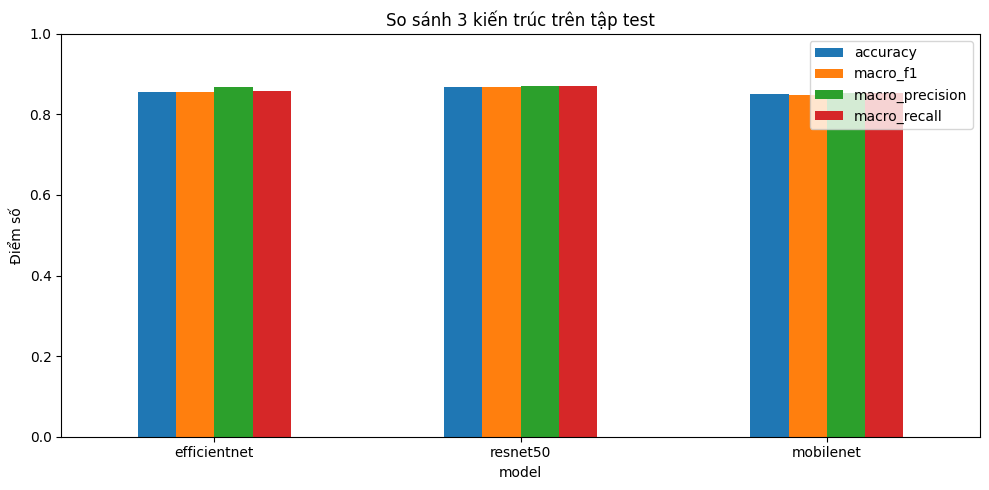

In [ ]:
import matplotlib.pyplot as plt

cols = [c for c in ["accuracy", "macro_f1", "macro_precision", "macro_recall"]
        if c in df_compare.columns]

ax = df_compare[cols].plot(kind="bar", figsize=(10, 5))
ax.set_ylim(0, 1)
ax.set_title("So sánh 3 kiến trúc trên tập test")
ax.set_ylabel("Điểm số")
plt.xticks(rotation=0)
plt.tight_layout()
plt.savefig("outputs/model_comparison_bar.png", dpi=150)
plt.show()


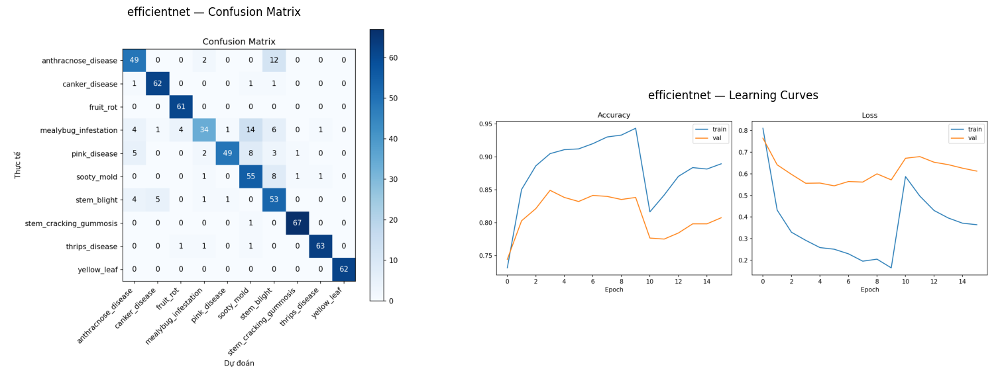

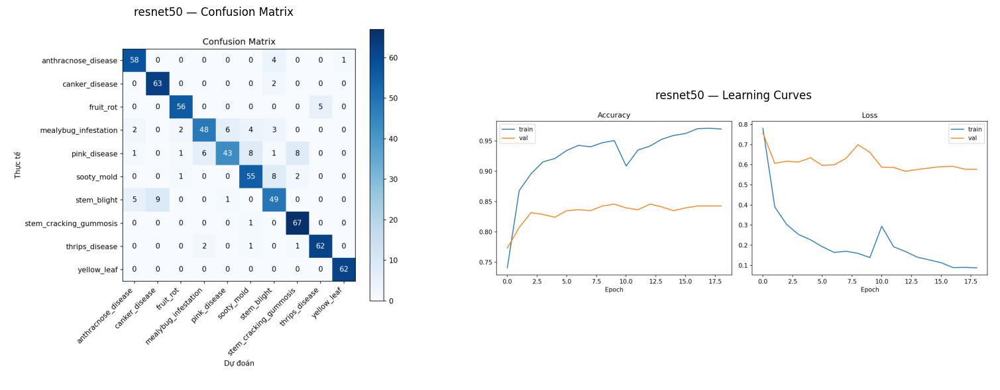

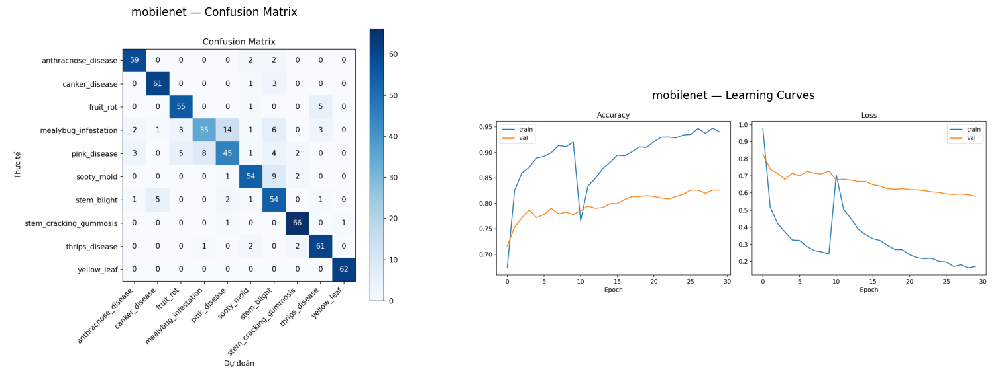

In [ ]:
# Hiển thị confusion matrix + learning curves của từng model
from PIL import Image

for m in ["efficientnet", "resnet50", "mobilenet"]:
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    for ax, suffix, title in [
        (axes[0], "confusion_matrix", f"{m} — Confusion Matrix"),
        (axes[1], "learning_curves", f"{m} — Learning Curves"),
    ]:
        path = f"outputs/{m}_{suffix}.png"
        if os.path.exists(path):
            ax.imshow(Image.open(path))
            ax.set_title(title)
        ax.axis("off")
    plt.tight_layout()
    plt.show()


In [ ]:
# Sanity check: KHÔNG xóa kết quả chính ở đây.
# Ablation phía sau cần dùng efficientnet_test_results.json.
required_main_results = [
    "outputs/efficientnet_test_results.json",
    "outputs/resnet50_test_results.json",
    "outputs/mobilenet_test_results.json",
]

missing = [p for p in required_main_results if not os.path.exists(p)]
if missing:
    raise FileNotFoundError(
        "Thiếu kết quả main experiment: " + ", ".join(missing) +
        ". Hãy chạy lại Mục 11 trước khi chạy ablation."
    )

print("✓ 3 file test_results của main experiments đang tồn tại và sẽ được giữ nguyên.")


✓ 3 file test_results của main experiments đang tồn tại và sẽ được giữ nguyên.


## 12. Ablation 1 — Có augmentation vs không augmentation

`train.py` mặc định luôn bật augmentation.
 cell dưới huấn luyện lại **EfficientNetB0** (model nhẹ nhất) trong 2 kịch bản ngắn hơn (chỉ giai đoạn train head, không fine-tune) để so sánh nhanh tác động của augmentation, tách biệt khỏi các yếu tố khác.

In [ ]:
import tensorflow as tf, os
import numpy as np, pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from models import build_model

ABLATION_EPOCHS = 10
R1 = os.path.join(ABLATION_OUTPUT_DIR, "augmentation_results.json")
M1 = os.path.join(ABLATION_OUTPUT_DIR, "augmentation_metadata.json")
cfg1 = {"model":"efficientnet","epochs":10,"backbone":"frozen",
        "seed":int(config.SEED),"img_size":list(config.IMG_SIZE),
        "comparison":"augmentation_vs_no_augmentation"}
fp1 = config_fingerprint(cfg1)

def evaluate_multiclass_model(model, test_ds):
    yt, yp = [], []
    for images, labels in test_ds:
        probs = model.predict(images, verbose=0)
        yt.extend(np.argmax(labels.numpy(),1)); yp.extend(np.argmax(probs,1))
    return {
        "accuracy":float(accuracy_score(yt,yp)),
        "macro_precision":float(precision_score(yt,yp,average="macro",zero_division=0)),
        "macro_recall":float(recall_score(yt,yp,average="macro",zero_division=0)),
        "macro_f1":float(f1_score(yt,yp,average="macro",zero_division=0))
    }

def run_aug_branch(augment, tag):
    tf.keras.backend.clear_session()
    tf.keras.utils.set_random_seed(config.SEED)
    tr=make_dataset(config.TRAIN_DIR,shuffle=True,augment=augment)
    va=make_dataset(config.VAL_DIR,shuffle=False,augment=False)
    te=make_dataset(config.TEST_DIR,shuffle=False,augment=False)
    model,_=build_model("efficientnet",freeze_backbone=True)
    model.compile(optimizer=tf.keras.optimizers.Adam(config.LEARNING_RATE_HEAD),
                  loss="categorical_crossentropy",metrics=["accuracy"])
    ckpt=os.path.join(ABLATION_MODEL_DIR,f"augmentation_{tag}_best.keras")
    hist=model.fit(tr,validation_data=va,epochs=ABLATION_EPOCHS,verbose=1,
        callbacks=[
            tf.keras.callbacks.ModelCheckpoint(ckpt,monitor="val_loss",
                                                save_best_only=True,verbose=1),
            tf.keras.callbacks.EarlyStopping(monitor="val_loss",patience=4,
                                             restore_best_weights=True)])
    best=tf.keras.models.load_model(ckpt)
    res=evaluate_multiclass_model(best,te)
    res["epochs_ran"]=len(hist.history["loss"]); res["checkpoint"]=os.path.basename(ckpt)
    save_json(os.path.join(ABLATION_OUTPUT_DIR,f"augmentation_{tag}_history.json"),
              {k:[float(x) for x in v] for k,v in hist.history.items()})
    return res

if os.path.exists(R1) and artifact_valid(M1,"ablation_1:augmentation",fp1) and not FORCE["ablation_1"]:
    x=load_json(R1); results_with_aug=x["with_augmentation"]; results_no_aug=x["without_augmentation"]
    print("✓ Ablation 1 cache hợp lệ -> SKIP 2 lần train")
else:
    results_with_aug=run_aug_branch(True,"with")
    results_no_aug=run_aug_branch(False,"without")
    save_json(R1,{"with_augmentation":results_with_aug,
                  "without_augmentation":results_no_aug})
    save_json(M1,{"experiment":"ablation_1:augmentation","dataset_total":5451,
                  "dataset_fingerprint":DATASET_FINGERPRINT,
                  "config":cfg1,"config_fingerprint":fp1})
    print("✓ Ablation 1 đã lưu 2 checkpoint + histories + results")

df_aug=pd.DataFrame([results_with_aug,results_no_aug],
                    index=["Có augmentation","Không augmentation"])
display(df_aug)


Found 4154 files belonging to 10 classes.
Found 649 files belonging to 10 classes.
Found 648 files belonging to 10 classes.
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 964ms/step - accuracy: 0.6106 - loss: 1.2070
Epoch 1: val_loss improved from None to 0.71921, saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/augmentation_with_best.keras

Epoch 1: finished saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/augmentation_with_best.keras
130/130 ━━━━━━━━━━━━━━━━━━━━ 183s 1s/step - accuracy: 0.7297 - loss: 0.8265 - val_accuracy: 0.7427 - val_loss: 0.7192
Epoch 2/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 874ms/step - accuracy: 0.8536 - loss: 0.4445
Epoch 2: val_loss improved from 0.71921 to 0.61403, saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/augmentation_with_best.keras

Epoch 2: finished saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/augmentation_

,accuracy,macro_precision,macro_recall,macro_f1,epochs_ran,checkpoint
Có augmentation,0.839506,0.843369,0.840140,0.836815,10,augmentation_with_best.keras
Không augmentation,0.841049,0.845032,0.841695,0.833891,7,augmentation_without_best.keras


## 13. Ablation 2 — Freeze toàn bộ backbone vs Fine-tune một phần

So sánh **EfficientNetB0** chỉ train head (backbone freeze hoàn toàn, không có giai đoạn fine-tune) với model đã fine-tune đầy đủ ở Mục 10 (`efficientnet_final.keras`).

In [ ]:
import tensorflow as tf, os, pandas as pd

R2=os.path.join(ABLATION_OUTPUT_DIR,"freeze_finetune_results.json")
M2=os.path.join(ABLATION_OUTPUT_DIR,"freeze_finetune_metadata.json")
C2=os.path.join(ABLATION_MODEL_DIR,"frozen_only_best.keras")
budget=int(config.EPOCHS_HEAD+config.EPOCHS_FINE_TUNE)
cfg2={"model":"efficientnet","comparison":"frozen_vs_main_finetuned",
      "frozen_epoch_budget":budget,"augmentation":True,
      "seed":int(config.SEED),"img_size":list(config.IMG_SIZE)}
fp2=config_fingerprint(cfg2)

if (os.path.exists(R2) and os.path.exists(C2)
    and artifact_valid(M2,"ablation_2:freeze_vs_finetune",fp2)
    and not FORCE["ablation_2"]):
    x=load_json(R2); results_frozen_only=x["frozen_only"]; results_finetuned=x["fine_tuned"]
    print("✓ Ablation 2 cache hợp lệ -> SKIP frozen training")
else:
    tf.keras.backend.clear_session(); tf.keras.utils.set_random_seed(config.SEED)
    tr=make_dataset(config.TRAIN_DIR,shuffle=True,augment=True)
    va=make_dataset(config.VAL_DIR,shuffle=False,augment=False)
    te=make_dataset(config.TEST_DIR,shuffle=False,augment=False)
    model,_=build_model("efficientnet",freeze_backbone=True)
    model.compile(optimizer=tf.keras.optimizers.Adam(config.LEARNING_RATE_HEAD),
                  loss="categorical_crossentropy",metrics=["accuracy"])
    hist=model.fit(tr,validation_data=va,epochs=budget,verbose=1,
        callbacks=[
            tf.keras.callbacks.ModelCheckpoint(C2,monitor="val_loss",
                                                save_best_only=True,verbose=1),
            tf.keras.callbacks.EarlyStopping(monitor="val_loss",patience=6,
                                             restore_best_weights=True)])
    best=tf.keras.models.load_model(C2)
    results_frozen_only=evaluate_multiclass_model(best,te)
    results_frozen_only["epochs_ran"]=len(hist.history["loss"])
    results_frozen_only["checkpoint"]=os.path.basename(C2)
    save_json(os.path.join(ABLATION_OUTPUT_DIR,"frozen_only_history.json"),
              {k:[float(x) for x in v] for k,v in hist.history.items()})

    main=load_json("outputs/efficientnet_test_results.json")
    keys=["accuracy","macro_precision","macro_recall","macro_f1"]
    results_finetuned={k:float(main[k]) for k in keys}
    results_finetuned["checkpoint"]=main.get("checkpoint","efficientnet_best.keras")
    save_json(R2,{"frozen_only":results_frozen_only,"fine_tuned":results_finetuned})
    save_json(M2,{"experiment":"ablation_2:freeze_vs_finetune","dataset_total":5451,
                  "dataset_fingerprint":DATASET_FINGERPRINT,
                  "config":cfg2,"config_fingerprint":fp2})
    print("✓ Ablation 2 đã lưu checkpoint + history + results")

df_freeze=pd.DataFrame([results_frozen_only,results_finetuned],
    index=["Freeze toàn bộ backbone","Fine-tune một phần (main experiment)"])
display(df_freeze)


Found 4154 files belonging to 10 classes.
Found 649 files belonging to 10 classes.
Found 648 files belonging to 10 classes.
Epoch 1/30
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 884ms/step - accuracy: 0.6059 - loss: 1.1976
Epoch 1: val_loss improved from None to 0.74961, saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/frozen_only_best.keras

Epoch 1: finished saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/frozen_only_best.keras
130/130 ━━━━━━━━━━━━━━━━━━━━ 165s 1s/step - accuracy: 0.7352 - loss: 0.8167 - val_accuracy: 0.7442 - val_loss: 0.7496
Epoch 2/30
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 807ms/step - accuracy: 0.8546 - loss: 0.4399
Epoch 2: val_loss improved from 0.74961 to 0.65430, saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/frozen_only_best.keras

Epoch 2: finished saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/frozen_only_best.keras
130/130 ━━━━━━━━━━━━━━━━━━━━ 164s 894ms/step - accuracy: 0.

,accuracy,macro_precision,macro_recall,macro_f1,epochs_ran,checkpoint
Freeze toàn bộ backbone,0.858025,0.869143,0.858585,0.857662,21.0,frozen_only_best.keras
Fine-tune một phần (main experiment),0.856481,0.867014,0.857659,0.855022,NaN,efficientnet_best.keras


## 14. Phân tích lớp dễ nhầm lẫn

Liệt kê các cặp lớp bị nhầm lẫn nhiều nhất trên tập test, dựa trên **model tốt nhất theo Accuracy ở Mục 11**.

Kết quả này dùng đúng checkpoint `best.keras` (fallback `final.keras`) đã được đối chiếu với bảng metric chính.


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix

best_model_name = df_compare["accuracy"].idxmax()
print("Model tốt nhất theo accuracy trên tập test:", best_model_name)

# Ưu tiên _best.keras — khớp đúng quy ước evaluate.py đang dùng ở Mục 12
# (log thực tế: "Đang tải model: saved_models/<model>_best.keras"), chỉ fallback
model_path = f"saved_models/{best_model_name}_best.keras"
if not os.path.exists(model_path):
    model_path = f"saved_models/{best_model_name}_final.keras"
model = tf.keras.models.load_model(model_path)
test_ds = make_dataset(config.TEST_DIR, shuffle=False, augment=False)

y_true, y_pred = [], []
for images, labels in test_ds:
    preds = model.predict(images, verbose=0)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))
y_true, y_pred = np.array(y_true), np.array(y_pred)

# labels=[0..9] tường minh: nếu không, sklearn tự suy luận số lớp từ chính
# y_true/y_pred — lỡ 1 lớp ít ảnh nhất (vd canker_disease) không xuất hiện trong
# tập test, ma trận trả về sẽ NHỎ HƠN 10x10, khiến vòng lặp bên dưới (giả định
# đúng 10x10) bị IndexError ngay lập tức.
all_labels = list(range(len(config.CLASS_NAMES)))
cm = confusion_matrix(y_true, y_pred, labels=all_labels)
pairs = []
for i in range(len(config.CLASS_NAMES)):
    for j in range(len(config.CLASS_NAMES)):
        if i != j and cm[i, j] > 0:
            pairs.append((config.CLASS_NAMES[i], config.CLASS_NAMES[j], int(cm[i, j])))

df_confused = pd.DataFrame(pairs, columns=["Thực tế", "Dự đoán nhầm thành", "Số lượng"])
df_confused = df_confused.sort_values("Số lượng", ascending=False).reset_index(drop=True)
df_confused.head(10)


Model tốt nhất theo accuracy trên tập test: resnet50
Found 648 files belonging to 10 classes.


,Thực tế,Dự đoán nhầm thành,Số lượng
0,stem_blight,canker_disease,9
1,pink_disease,stem_cracking_gummosis,8
2,sooty_mold,stem_blight,8
3,pink_disease,sooty_mold,8
4,pink_disease,mealybug_infestation,6
5,mealybug_infestation,pink_disease,6
6,fruit_rot,thrips_disease,5
7,stem_blight,anthracnose_disease,5
8,anthracnose_disease,stem_blight,4
9,mealybug_infestation,sooty_mold,4


## 15. Grad-CAM — trực quan hóa vùng model chú ý

Chạy Grad-CAM trên 1 ảnh mẫu mỗi lớp bằng model tốt nhất, để kiểm chứng model học đúng vùng tổn thương trên lá (không học nền/artefact).

In [ ]:
%cd {CODE_DIR}
import glob, os
sample_images=[]
for cls in config.CLASS_NAMES:
    fs=sorted(glob.glob(os.path.join(config.TEST_DIR,cls,"*")))
    if fs: sample_images.append((cls,fs[0]))

for cls,img_path in sample_images:
    out_path=f"outputs/gradcam_{best_model_name}_{os.path.basename(img_path)}"
    if os.path.exists(out_path) and not FORCE["gradcam"]:
        print(f"✓ {cls}: Grad-CAM đã có -> SKIP")
    else:
        print(f"--- {cls} ---")
        !python gradcam.py --model {best_model_name} --image "{img_path}"


/content
--- anthracnose_disease ---
2026-09-17 11:23:03.969246: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0000 00:00:1789644183.970768   31957 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9529 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
/usr/local/lib/python3.13/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_1']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)
Dự đoán: anthracnose_disease
Đã lưu ảnh Grad-CAM tại: outputs/gradcam_resnet50_00163.png
--- canker_disease ---
2026-09-17 11:23:26.365539: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environ

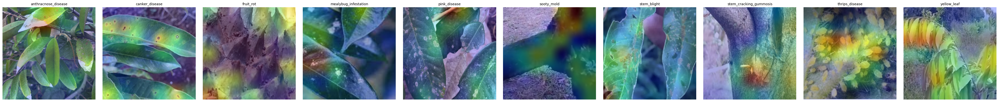

In [ ]:
# Hiển thị lưới ảnh Grad-CAM cho tất cả các lớp mẫu
n = len(sample_images)
fig, axes = plt.subplots(1, n, figsize=(4 * n, 4))
if n == 1:
    axes = [axes]
for ax, (cls, img_path) in zip(axes, sample_images):
    out_path = f"outputs/gradcam_{best_model_name}_{os.path.basename(img_path)}"
    if os.path.exists(out_path):
        ax.imshow(Image.open(out_path))
    ax.set_title(cls, fontsize=10)
    ax.axis("off")
plt.tight_layout()
plt.savefig("outputs/gradcam_grid_all_classes.png", dpi=150)
plt.show()


## 17. Tổng hợp kết quả cho báo cáo

Bảng tổng hợp cuối **tách rõ**:
- `main`: các mô hình chính dùng để xếp hạng.
- `baseline`: SVM với handcrafted features.
- `ablation`: chỉ dùng để phân tích tác động của từng lựa chọn thiết kế.

Không dùng ablation để xếp hạng chung với ba CNN vì điều kiện huấn luyện khác mục tiêu.


In [ ]:
import os, json
import pandas as pd

summary_rows = []

# 1) Main CNN experiments
for m in ["efficientnet", "resnet50", "mobilenet"]:
    path = f"outputs/{m}_test_results.json"
    if os.path.exists(path):
        with open(path) as f:
            r = json.load(f)
        summary_rows.append({
            "Nhóm": "main",
            "Thí nghiệm": f"{m} (fine-tuned)",
            "Accuracy": r.get("accuracy"),
            "Macro Precision": r.get("macro_precision"),
            "Macro Recall": r.get("macro_recall"),
            "Macro F1": r.get("macro_f1"),
        })

# 2) Traditional image-processing baseline
svm_path = "outputs/svm_handcrafted_test_results.json"
if os.path.exists(svm_path):
    with open(svm_path) as f:
        r = json.load(f)
    summary_rows.append({
        "Nhóm": "baseline",
        "Thí nghiệm": "Histogram + GLCM + SVM",
        "Accuracy": r.get("accuracy"),
        "Macro Precision": r.get("macro_precision"),
        "Macro Recall": r.get("macro_recall"),
        "Macro F1": r.get("macro_f1"),
    })

# 3) Augmentation ablation
if os.path.exists(os.path.join(ABLATION_OUTPUT_DIR, "augmentation_results.json")):
    with open(os.path.join(ABLATION_OUTPUT_DIR, "augmentation_results.json")) as f:
        a = json.load(f)
    for label, key in [
        ("Ablation: có augmentation", "with_augmentation"),
        ("Ablation: không augmentation", "without_augmentation"),
    ]:
        r = a[key]
        summary_rows.append({
            "Nhóm": "ablation",
            "Thí nghiệm": label,
            "Accuracy": r.get("accuracy"),
            "Macro Precision": r.get("macro_precision"),
            "Macro Recall": r.get("macro_recall"),
            "Macro F1": r.get("macro_f1"),
        })

# 4) Freeze vs fine-tune ablation
if os.path.exists(os.path.join(ABLATION_OUTPUT_DIR, "freeze_finetune_results.json")):
    with open(os.path.join(ABLATION_OUTPUT_DIR, "freeze_finetune_results.json")) as f:
        a = json.load(f)
    for label, key in [
        ("Ablation: freeze toàn bộ backbone", "frozen_only"),
        ("Ablation: fine-tune một phần", "fine_tuned"),
    ]:
        r = a[key]
        summary_rows.append({
            "Nhóm": "ablation",
            "Thí nghiệm": label,
            "Accuracy": r.get("accuracy"),
            "Macro Precision": r.get("macro_precision"),
            "Macro Recall": r.get("macro_recall"),
            "Macro F1": r.get("macro_f1"),
        })

df_summary = pd.DataFrame(summary_rows)
df_summary.to_csv("outputs/summary_all_experiments.csv", index=False)

print("Đã lưu: outputs/summary_all_experiments.csv")
print("\n=== MAIN / BASELINE ===")
display(df_summary[df_summary["Nhóm"].isin(["main", "baseline"])])

print("\n=== ABLATION (không dùng để xếp hạng chung) ===")
display(df_summary[df_summary["Nhóm"] == "ablation"])


Đã lưu: outputs/summary_all_experiments.csv

=== MAIN / BASELINE ===


,Nhóm,Thí nghiệm,Accuracy,Macro Precision,Macro Recall,Macro F1
0,main,efficientnet (fine-tuned),0.856481,0.867014,0.857659,0.855022
1,main,resnet50 (fine-tuned),0.868827,0.870118,0.870236,0.867180
2,main,mobilenet (fine-tuned),0.851852,0.852257,0.853360,0.849213
3,baseline,Histogram + GLCM + SVM,0.800926,0.808797,0.801745,0.793404



=== ABLATION (không dùng để xếp hạng chung) ===


,Nhóm,Thí nghiệm,Accuracy,Macro Precision,Macro Recall,Macro F1
4,ablation,Ablation: có augmentation,0.839506,0.843369,0.840140,0.836815
5,ablation,Ablation: không augmentation,0.841049,0.845032,0.841695,0.833891
6,ablation,Ablation: freeze toàn bộ backbone,0.858025,0.869143,0.858585,0.857662
7,ablation,Ablation: fine-tune một phần,0.856481,0.867014,0.857659,0.855022


## Ghi chú / checklist trước khi nộp

- Bài toán chính: **10-class Image Classification**.
- Không thêm Object Detection/Segmentation vì dataset không có bounding box/mask.
- **Color Histogram + GLCM + SVM** là baseline xử lý ảnh truyền thống.
- Augmentation chỉ áp dụng cho train.
- Main experiments và ablation được **tách riêng**, không xếp hạng chung.
- Kết quả chính dùng **Accuracy + Macro Precision + Macro Recall + Macro F1**.
- `*_test_results.json` phải được tạo lại từ chính checkpoint vừa evaluate; không dùng stale JSON.
- Chỉ skip training khi có đồng thời `best.keras` và `final.keras`.
- Có demo deployment: Streamlit


## 18. Trạng thái Resume/Cache


In [ ]:
from pathlib import Path
checks={
 "EfficientNet":Path(PROJECT_DIR)/"saved_models/efficientnet_best.keras",
 "ResNet50":Path(PROJECT_DIR)/"saved_models/resnet50_best.keras",
 "MobileNet":Path(PROJECT_DIR)/"saved_models/mobilenet_best.keras",
 "Ablation1 result":Path(ABLATION_OUTPUT_DIR)/"augmentation_results.json",
 "Ablation1 with aug":Path(ABLATION_MODEL_DIR)/"augmentation_with_best.keras",
 "Ablation1 without aug":Path(ABLATION_MODEL_DIR)/"augmentation_without_best.keras",
 "Ablation2 result":Path(ABLATION_OUTPUT_DIR)/"freeze_finetune_results.json",
 "Ablation2 frozen":Path(ABLATION_MODEL_DIR)/"frozen_only_best.keras",
}
for name,p in checks.items():
    print(("✓" if p.exists() else "✗"),f"{name:24s}",p)
print("\nLần 2 giữ FORCE=False -> artifact hợp lệ sẽ được load/skip training.")


✓ EfficientNet             /content/drive/MyDrive/durian_leaf/saved_models/efficientnet_best.keras
✓ ResNet50                 /content/drive/MyDrive/durian_leaf/saved_models/resnet50_best.keras
✓ MobileNet                /content/drive/MyDrive/durian_leaf/saved_models/mobilenet_best.keras
✓ Ablation1 result         /content/drive/MyDrive/durian_leaf/outputs/ablation/augmentation_results.json
✓ Ablation1 with aug       /content/drive/MyDrive/durian_leaf/saved_models/ablation/augmentation_with_best.keras
✓ Ablation1 without aug    /content/drive/MyDrive/durian_leaf/saved_models/ablation/augmentation_without_best.keras
✓ Ablation2 result         /content/drive/MyDrive/durian_leaf/outputs/ablation/freeze_finetune_results.json
✓ Ablation2 frozen         /content/drive/MyDrive/durian_leaf/saved_models/ablation/frozen_only_best.keras

Lần 2 giữ FORCE=False -> artifact hợp lệ sẽ được load/skip training.


In [ ]:
required_main = {"efficientnet", "resnet50", "mobilenet"}
main_df = df_summary[df_summary["Nhóm"] == "main"].copy()

found_main = set(
    main_df["Thí nghiệm"]
    .str.replace(" (fine-tuned)", "", regex=False)
    .tolist()
)

assert found_main == required_main, (
    f"Main experiments chưa đủ. Có={found_main}, cần={required_main}"
)

assert main_df["Thí nghiệm"].is_unique, "Có experiment bị lặp tên."

for col in ["Accuracy", "Macro Precision", "Macro Recall", "Macro F1"]:
    assert main_df[col].notna().all(), f"Main experiments thiếu {col}"
    assert main_df[col].between(0, 1).all(), f"{col} có giá trị ngoài [0,1]"

best_row = main_df.loc[main_df["Accuracy"].idxmax()]

print("✓ Notebook summary nhất quán.")
print(
    f"Best main model: {best_row['Thí nghiệm']} | "
    f"Accuracy={best_row['Accuracy']:.4f} | "
    f"Macro-F1={best_row['Macro F1']:.4f}"
)


✓ Notebook summary nhất quán.
Best main model: resnet50 (fine-tuned) | Accuracy=0.8688 | Macro-F1=0.8672
